<a href="https://colab.research.google.com/github/SmaranikaManaswini/6th-sem-project/blob/main/6thSem_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dataset_path = "/content/drive/MyDrive/Railway Track fault Detection Updated"  # Change this to your actual dataset path
train_dir = "/content/drive/MyDrive/Railway Track fault Detection Updated/Train"
val_dir = "/content/drive/MyDrive/Railway Track fault Detection Updated/Validation"
test_dir = "/content/drive/MyDrive/Railway Track fault Detection Updated/Test"


In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Railway Track fault Detection Updated"  # Change this to your actual dataset path

if os.path.exists(dataset_path):
    print("Dataset found! ✅")
    print(os.listdir(dataset_path))  # List folder contents
else:
    print("Dataset NOT found! ❌ Check the path.")

Dataset found! ✅
['Train', 'Validation', '.ipynb_checkpoints', 'Test']


In [ ]:
import os

def count_images(directory):
    count = 0
    for root, dirs, files in os.walk(directory):
        count += len([file for file in files if file.endswith(('.png', '.jpg', '.jpeg'))])
    return count

dataset_path = "/content/drive/MyDrive/Railway Track fault Detection Updated"  # Change this to your dataset folder path
num_images = count_images(dataset_path)
print(f"Total images in dataset: {num_images}")


Total images in dataset: 383


In [ ]:
import os

base_dir = "/content/drive/MyDrive/Railway Track fault Detection Updated"

for category in ["Train", "Validation", "Test"]:
    path = os.path.join(base_dir, category)
    num_images = sum([len(files) for _, _, files in os.walk(path) if files])
    print(f"{category} images: {num_images}")


Train images: 300
Validation images: 62
Test images: 22


In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Railway Track fault Detection Updated"

for root, dirs, files in os.walk(dataset_path):
    print(f"📂 {root}")
    for file in files:
        print(f"   📄 {file}")


📂 /content/drive/MyDrive/Railway Track fault Detection Updated
📂 /content/drive/MyDrive/Railway Track fault Detection Updated/Train
📂 /content/drive/MyDrive/Railway Track fault Detection Updated/Train/Defective
   📄 131004959_171473721383413_8222187747086021011_n.jpg
   📄 131051004_382613492830631_1306891331783850055_n.jpg
   📄 131065180_999185033824671_7735147288489715620_n.jpg
   📄 131084537_190751489449739_279862595635733772_n.jpg
   📄 131092897_149705809860659_8798464983059531038_n.jpg
   📄 131098429_134147575143001_1246437012995704959_n.jpg
   📄 131129946_140815574232570_8925999503657494497_n.jpg
   📄 131275810_2686956714949012_5021348409242545922_n.jpg
   📄 131348023_405054987354853_8834671660058234194_n.jpg
   📄 131437543_500273490949549_5045378072687137331_n.jpg
   📄 2007.05.16_-_002_Broken_rail_weld_-_Flickr_-_faxepl (1).jpg
   📄 2007.05.16_-_002_Broken_rail_weld_-_Flickr_-_faxepl.jpg
   📄 6411009.jpg
   📄 89e8b1a9ca8c41919021f8f4faaf37f0.jpg
   📄 Broken_railroad_tracks_1.jpg


---- Train Set ----
Defective: 150 images
Non defective: 150 images


---- Validation Set ----
Defective: 31 images
Non defective: 31 images


---- Test Set ----
Defective: 11 images
Non defective: 11 images


📌 Sample Defective Images


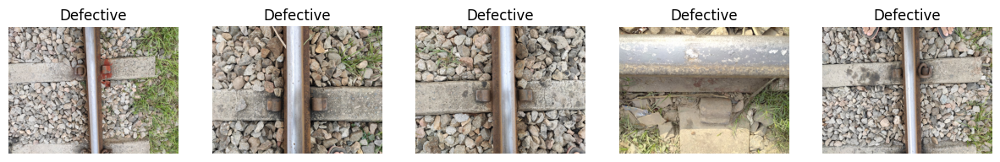

📌 Sample Non-Defective Images


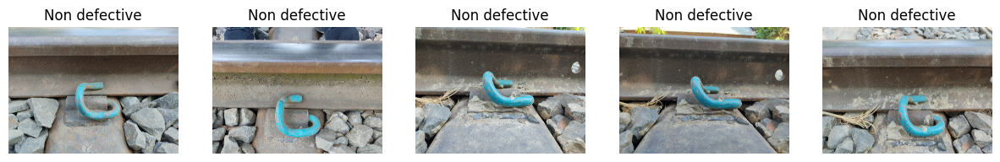

Category: Defective
Image Shape: (720, 960, 3) (Height, Width, Channels)
Data Type: uint8

Category: Non defective
Image Shape: (3000, 4000, 3) (Height, Width, Channels)
Data Type: uint8



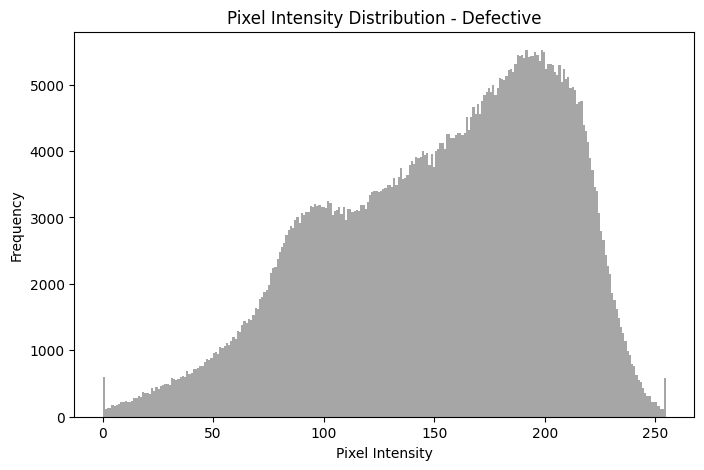

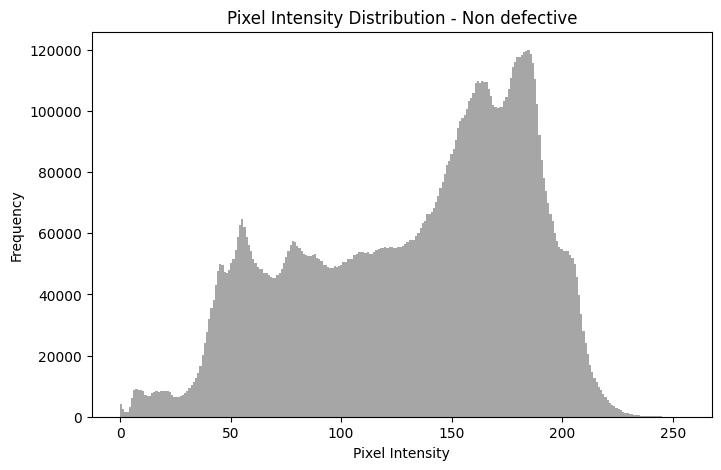

In [ ]:
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Define dataset paths
dataset_path = "/content/drive/MyDrive/Railway Track fault Detection Updated"
sets = ["Train", "Validation", "Test"]
categories = ["Defective", "Non defective"]

# Check class distribution
for set_name in sets:
    print(f"---- {set_name} Set ----")
    for category in categories:
        category_path = os.path.join(dataset_path, set_name, category)
        num_images = len(os.listdir(category_path))
        print(f"{category}: {num_images} images")
    print("\n")

# Function to show sample images
def show_images(dataset_path, category, num_images=5):
    category_path = os.path.join(dataset_path, "Train", category)
    img_files = os.listdir(category_path)[:num_images]

    fig, axes = plt.subplots(1, num_images, figsize=(15,5))
    for i, img_name in enumerate(img_files):
        img_path = os.path.join(category_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
        axes[i].imshow(img)
        axes[i].set_title(category)
        axes[i].axis('off')
    plt.show()

# Show sample images from each class
print("📌 Sample Defective Images")
show_images(dataset_path, "Defective")

print("📌 Sample Non-Defective Images")
show_images(dataset_path, "Non defective")

# Check image properties (size, color channels)
def check_image_properties(dataset_path, category):
    category_path = os.path.join(dataset_path, "Train", category)
    img_name = os.listdir(category_path)[0]
    img_path = os.path.join(category_path, img_name)
    img = cv2.imread(img_path)

    print(f"Category: {category}")
    print(f"Image Shape: {img.shape} (Height, Width, Channels)")
    print(f"Data Type: {img.dtype}\n")

# Check properties for both categories
check_image_properties(dataset_path, "Defective")
check_image_properties(dataset_path, "Non defective")

# Plot Pixel Intensity Distribution
def plot_pixel_distribution(dataset_path, category):
    category_path = os.path.join(dataset_path, "Train", category)
    img_name = os.listdir(category_path)[0]
    img_path = os.path.join(category_path, img_name)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale

    plt.figure(figsize=(8, 5))
    plt.hist(img.ravel(), bins=256, color='gray', alpha=0.7)
    plt.title(f"Pixel Intensity Distribution - {category}")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.show()

# Check intensity distribution
plot_pixel_distribution(dataset_path, "Defective")
plot_pixel_distribution(dataset_path, "Non defective")


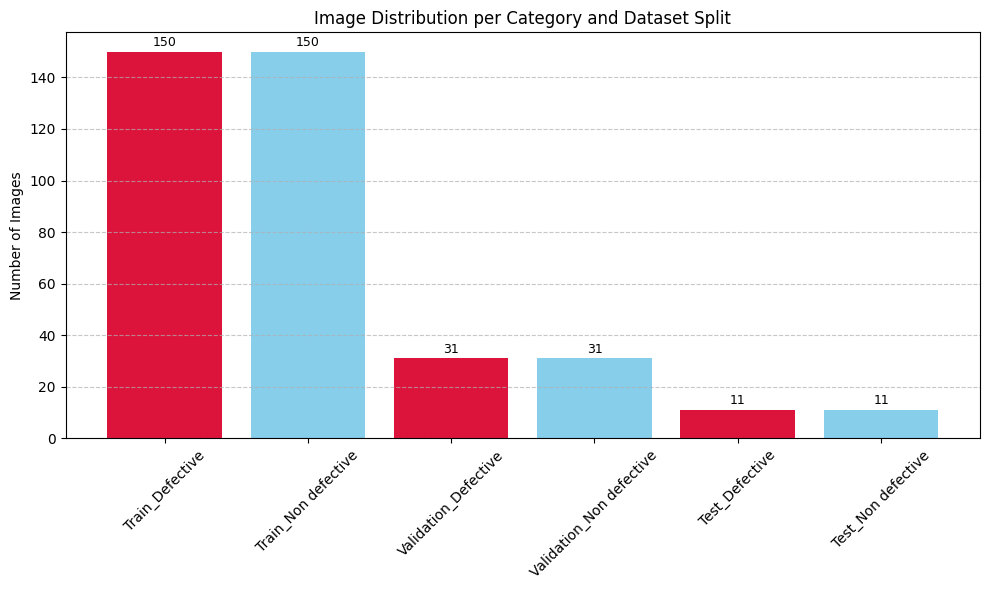

In [ ]:
import os
import matplotlib.pyplot as plt

# Path to your dataset
dataset_path = "/content/drive/MyDrive/Railway Track fault Detection Updated"

# Get dataset splits
splits = ["Train", "Validation", "Test"]

# Initialize dictionary for storing counts
data_distribution = {}

# Loop through each split
for split in splits:
    split_path = os.path.join(dataset_path, split)
    if not os.path.exists(split_path):
        continue
    for category in os.listdir(split_path):
        category_path = os.path.join(split_path, category)
        if os.path.isdir(category_path):
            count = len([f for f in os.listdir(category_path) if os.path.isfile(os.path.join(category_path, f))])
            label = f"{split.capitalize()}_{category.capitalize()}"
            data_distribution[label] = count

# Plotting
labels = list(data_distribution.keys())
values = list(data_distribution.values())

plt.figure(figsize=(10, 6))
bars = plt.bar(labels, values, color=["crimson", "skyblue"] * 3)
plt.xticks(rotation=45)
plt.ylabel("Number of Images")
plt.title("Image Distribution per Category and Dataset Split")
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate each bar with its value
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, f'{height}',
             ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


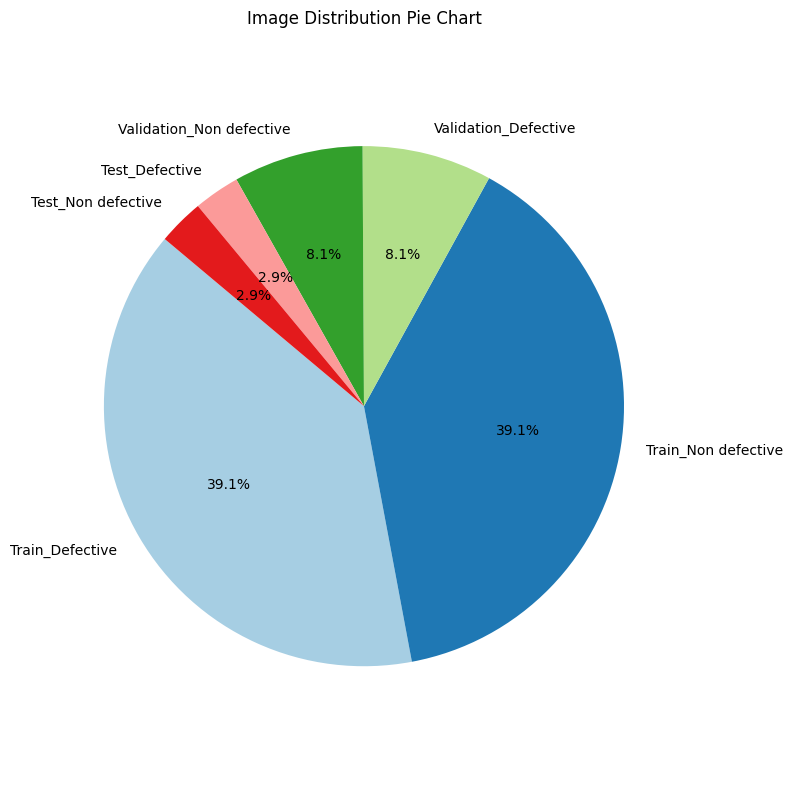

In [ ]:
# Pie Chart
plt.figure(figsize=(8, 8))
colors = plt.cm.Paired(range(len(labels)))
plt.pie(values, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title("Image Distribution Pie Chart")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()
plt.show()


DATASET PREPROCESSING AND AUGMENTATION


In [ ]:
!pip install opencv-python numpy scikit-image


In [ ]:
import cv2
import numpy as np
import os
import random
import skimage.feature
from google.colab.patches import cv2_imshow  # Required for displaying images in Colab


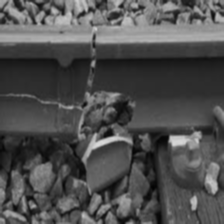

In [ ]:
IMG_SIZE = (224, 224)  # Standard size for images

def preprocess_image(image_path):
    img = cv2.imread(image_path)  # Read image
    img = cv2.resize(img, IMG_SIZE)  # Resize image
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    img = cv2.GaussianBlur(img, (3, 3), 0)  # Reduce noise
    img = img / 255.0  # Normalize pixel values to 0-1
    return img

# Example usage
image_path = "/content/drive/MyDrive/Railway Track fault Detection Updated/Train/Defective/download (6).jpeg"
processed_img = preprocess_image(image_path)

# Display the processed image
cv2_imshow(processed_img * 255)  # Convert back to 0-255 range for display


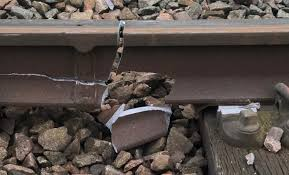

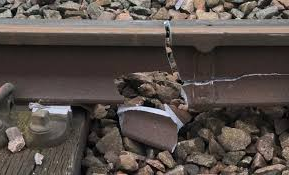

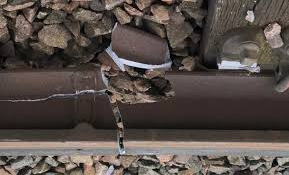

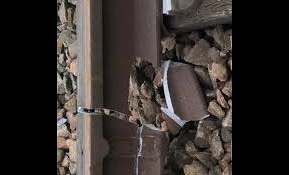

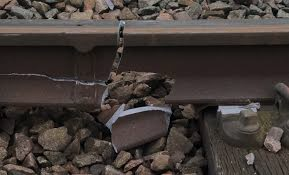

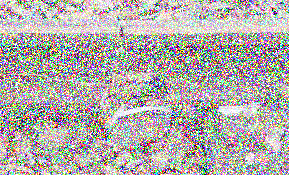

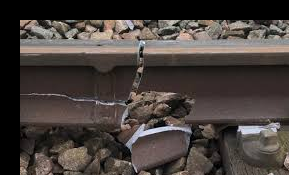

In [ ]:
import cv2
import numpy as np
import random
from google.colab.patches import cv2_imshow  # For displaying images in Google Colab

# Function to flip images horizontally & vertically
def flip_image(image):
    flipped_h = cv2.flip(image, 1)  # Horizontal flip
    flipped_v = cv2.flip(image, 0)  # Vertical flip
    return [flipped_h, flipped_v]

# Function to rotate image by a random angle
def rotate_image(image, angle=None):
    if angle is None:
        angle = random.choice([90, 180, 270])  # Random angle
    h, w = image.shape[:2]
    center = (w // 2, h // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, rotation_matrix, (w, h))
    return rotated

# Function to adjust brightness randomly
def adjust_brightness(image, factor=None):
    if factor is None:
        factor = random.uniform(0.5, 1.5)  # Random brightness factor
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hsv[:, :, 2] = np.clip(hsv[:, :, 2] * factor, 0, 255)
    return cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

# Function to add Gaussian noise
def add_noise(image):
    noise = np.random.normal(0, 25, image.shape).astype(np.uint8)  # Mean=0, Std=25
    noisy_image = cv2.add(image, noise)  # Add noise to image
    return noisy_image

# Function to translate (shift) the image
def translate_image(image, tx=20, ty=20):
    h, w = image.shape[:2]
    translation_matrix = np.float32([[1, 0, tx], [0, 1, ty]])
    translated = cv2.warpAffine(image, translation_matrix, (w, h))
    return translated

# Function to apply all augmentations
def augment_image(image):
    augmented_images = []
    augmented_images.extend(flip_image(image))
    augmented_images.append(rotate_image(image))
    augmented_images.append(adjust_brightness(image))
    augmented_images.append(add_noise(image))
    augmented_images.append(translate_image(image))
    return augmented_images

# Load image for testing augmentation
image_path = "/content/drive/MyDrive/Railway Track fault Detection Updated/Train/Defective/download (6).jpeg"
original_img = cv2.imread(image_path)

# Apply augmentation
augmented_images = augment_image(original_img)

# Display original & augmented images
cv2_imshow(original_img)
for img in augmented_images:
    cv2_imshow(img)


In [ ]:
import cv2
import os

# Output directory for augmented images
output_dir = "/content/augmented_data/Train/Defective"
os.makedirs(output_dir, exist_ok=True)

# Save original image
cv2.imwrite(os.path.join(output_dir, "original.jpg"), original_img)

# Save augmented images
for i, img in enumerate(augmented_images):
    save_path = os.path.join(output_dir, f"augmented_{i}.jpg")
    cv2.imwrite(save_path, img)

print(f"✅ {len(augmented_images)} augmented images saved successfully!")


✅ 6 augmented images saved successfully!


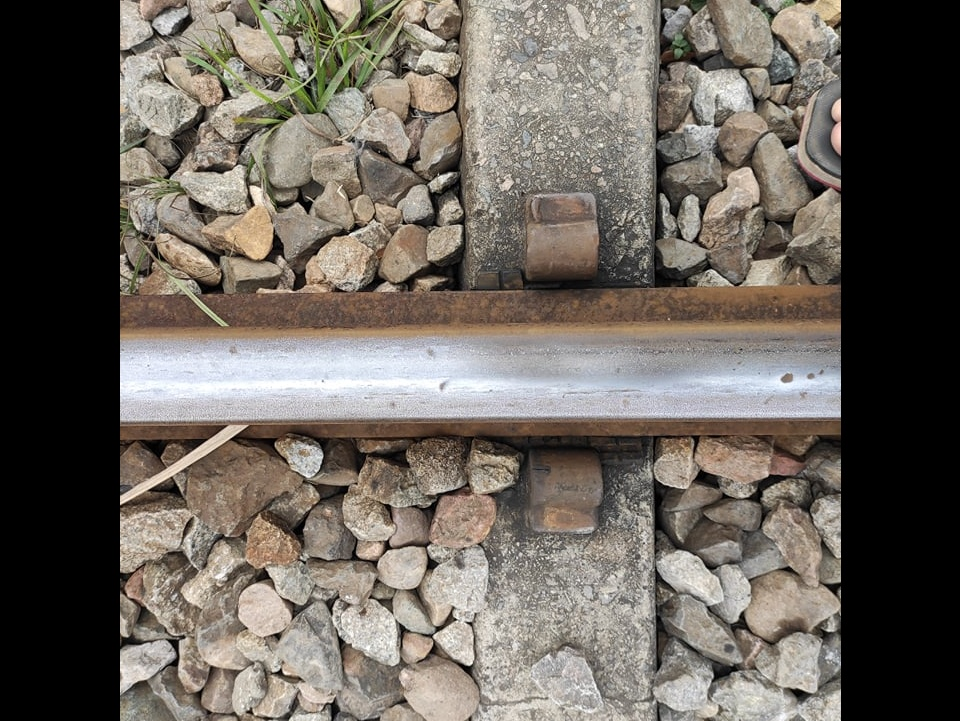

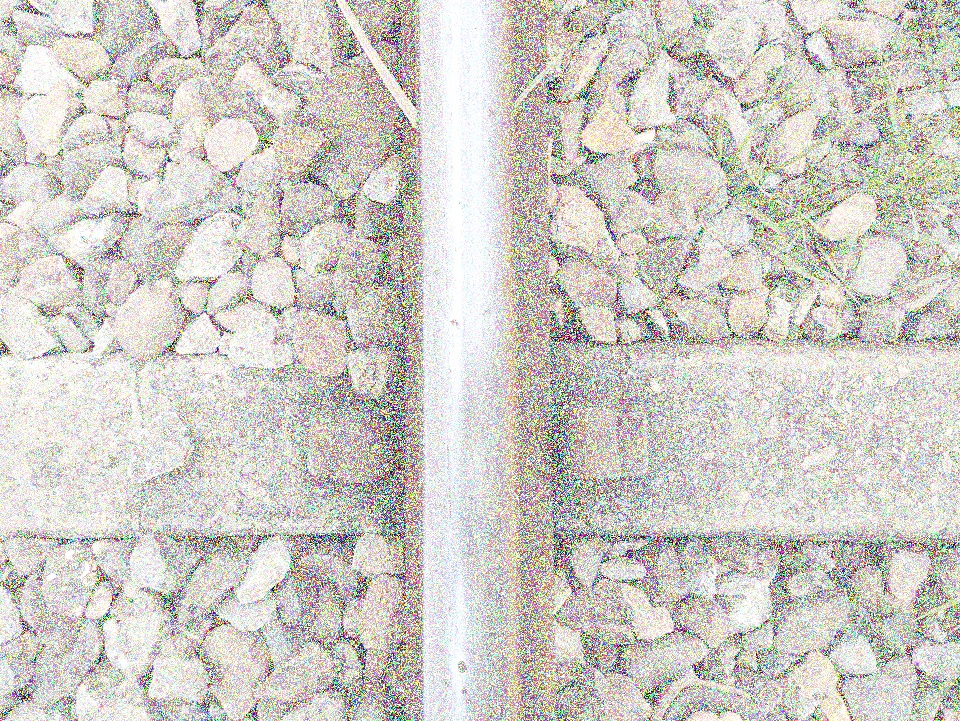

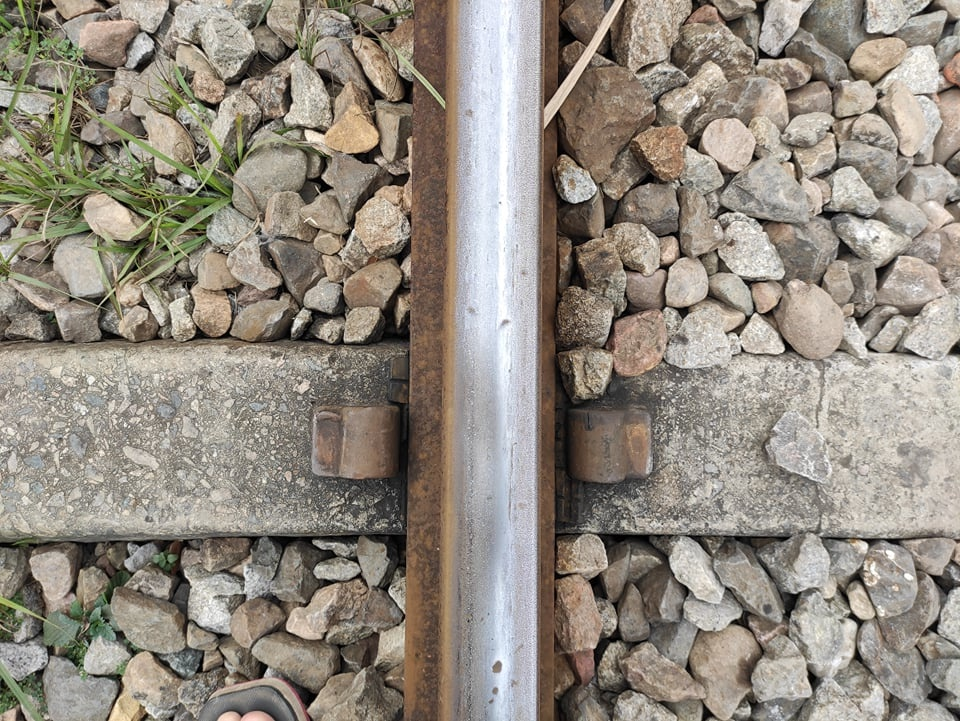

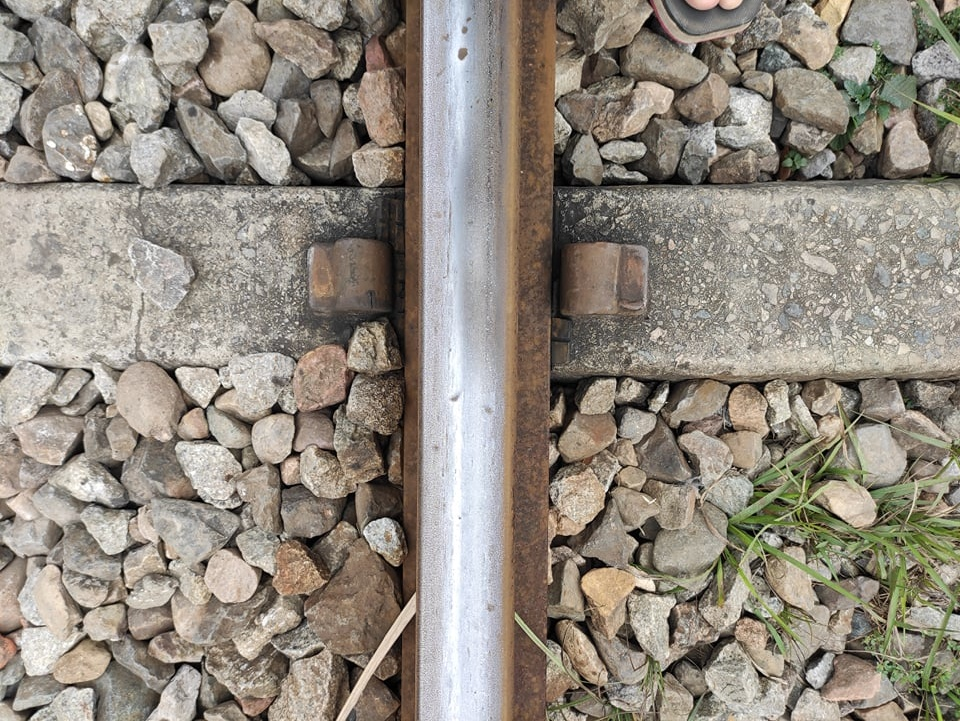

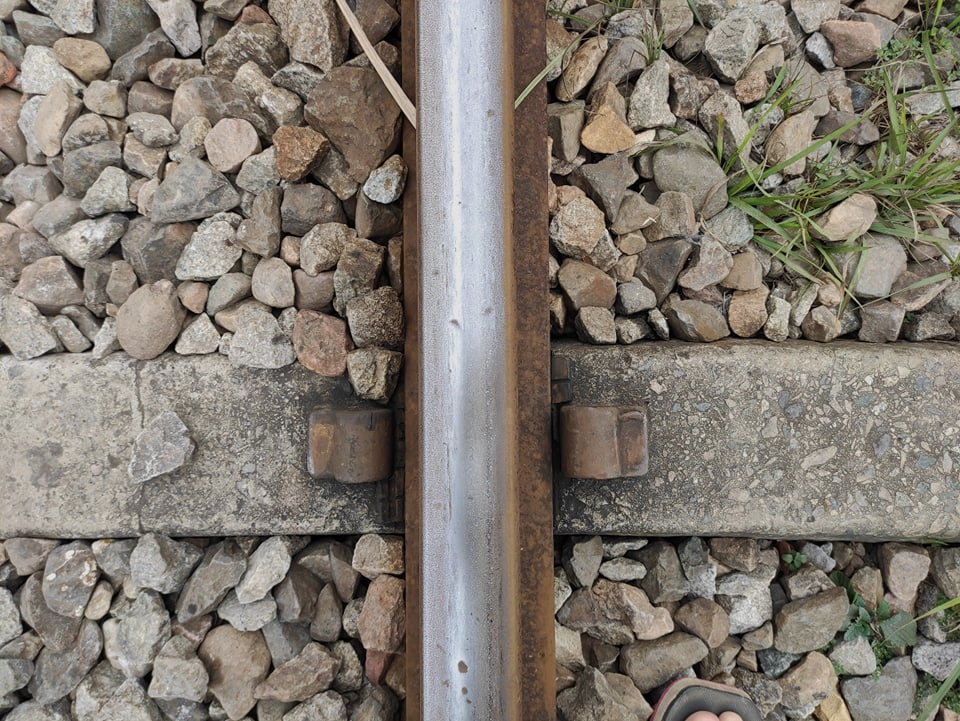

In [ ]:
import glob
from google.colab.patches import cv2_imshow

# Get list of augmented images
augmented_images_paths = glob.glob("/content/augmented_data/Train/Defective/*.jpg")

# Display a few augmented images
for img_path in augmented_images_paths[:5]:  # Show first 5 images
    img = cv2.imread(img_path)
    cv2_imshow(img)


In [ ]:
import os
import cv2

def check_images(directory):
    total_images = len(os.listdir(directory))
    readable_images = 0

    for img_name in os.listdir(directory):
        img_path = os.path.join(directory, img_name)
        img = cv2.imread(img_path)
        if img is not None:
            readable_images += 1
        else:
            print(f"Corrupted/Missing: {img_name}")  # Print corrupted file names

    print(f"Total Images: {total_images}")
    print(f"Readable Images: {readable_images}")

# Path to the Defective folder
defective_path = "/content/drive/MyDrive/Railway Track fault Detection Updated/Train/Defective"
check_images(defective_path)


Total Images: 150
Readable Images: 150


In [ ]:
import cv2
import os

original_path = "/content/drive/MyDrive/Railway Track fault Detection Updated/Train/Defective"
unreadable_images = []

for img_name in os.listdir(original_path):
    img_path = os.path.join(original_path, img_name)
    img = cv2.imread(img_path)

    if img is None:
        unreadable_images.append(img_name)

print("❌ Unreadable Images:", unreadable_images)


❌ Unreadable Images: []


In [ ]:
import os
import cv2
import numpy as np
import random

# Define dataset paths
dataset_path = "/content/drive/MyDrive/Railway Track fault Detection Updated"
output_path = "/content/drive/MyDrive/Augmented_Dataset/val"

sets = ["Validation"]
categories = ["Defective", "Non defective"]

# Create output directories
for set_name in sets:
    for category in categories:
        os.makedirs(os.path.join(output_path, set_name, category), exist_ok=True)

# Define augmentation functions
def rotate_image(image):
    angle = random.randint(-30, 30)
    h, w = image.shape[:2]
    M = cv2.getRotationMatrix2D((w // 2, h // 2), angle, 1)
    return cv2.warpAffine(image, M, (w, h))

def flip_image(image):
    return cv2.flip(image, 1)  # Horizontal flip

def adjust_brightness(image):
    factor = 0.5 + random.uniform(0.5, 1.5)  # Random brightness factor
    return np.clip(image * factor, 0, 255).astype(np.uint8)

def add_noise(image):
    noise = np.random.randint(0, 50, image.shape, dtype=np.uint8)
    return np.clip(image + noise, 0, 255).astype(np.uint8)

def translate_image(image):
    h, w = image.shape[:2]
    tx, ty = random.randint(-20, 20), random.randint(-20, 20)
    M = np.float32([[1, 0, tx], [0, 1, ty]])
    return cv2.warpAffine(image, M, (w, h))

def zoom_image(image):
    h, w = image.shape[:2]
    scale = random.uniform(1.2, 1.5)
    new_h, new_w = int(h / scale), int(w / scale)

    cropped = image[(h-new_h)//2:(h+new_h)//2, (w-new_w)//2:(w+new_w)//2]
    return cv2.resize(cropped, (w, h))

# Number of augmentations per image
num_augmentations = 5

# Process images
for set_name in sets:
    for category in categories:
        input_dir = os.path.join(dataset_path, set_name, category)
        output_dir = os.path.join(output_path, set_name, category)

        for filename in os.listdir(input_dir):
            img_path = os.path.join(input_dir, filename)
            image = cv2.imread(img_path)
            if image is None:
                continue

            # Save original image
            cv2.imwrite(os.path.join(output_dir, filename), image)

            # Only augment training set
            if set_name == "Validation":
                for i in range(num_augmentations):
                    augmented_image = random.choice([
                        rotate_image(image),
                        flip_image(image),
                        adjust_brightness(image),
                        add_noise(image),
                        translate_image(image),
                        zoom_image(image)
                    ])

                    # Save augmented image
                    aug_filename = f"{os.path.splitext(filename)[0]}_aug_{i}.jpg"
                    cv2.imwrite(os.path.join(output_dir, aug_filename), augmented_image)

print("Training images augmented. Validation & Test remain unchanged.")


Training images augmented. Validation & Test remain unchanged.


In [ ]:
import os

# Define the augmented dataset path
augmented_dataset_path = "/content/drive/MyDrive/Augmented_Dataset"

# Function to count images in each category
def count_images_in_folder(dataset_path):
    sets = ["Train", "Val", "Test"]
    categories = ["Defective", "Non defective"]

    for set_name in sets:
        print(f"\n--- {set_name} Set ---")
        for category in categories:
            folder_path = os.path.join(dataset_path, set_name, category)
            if os.path.exists(folder_path):
                num_images = len([f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png'))])
                print(f"{category}: {num_images} images")
            else:
                print(f"{category}: Folder not found!")

# Count images in the augmented dataset
count_images_in_folder(augmented_dataset_path)



--- Train Set ---
Defective: 892 images
Non defective: 900 images

--- Val Set ---
Defective: 186 images
Non defective: 186 images

--- Test Set ---
Defective: 11 images
Non defective: 11 images


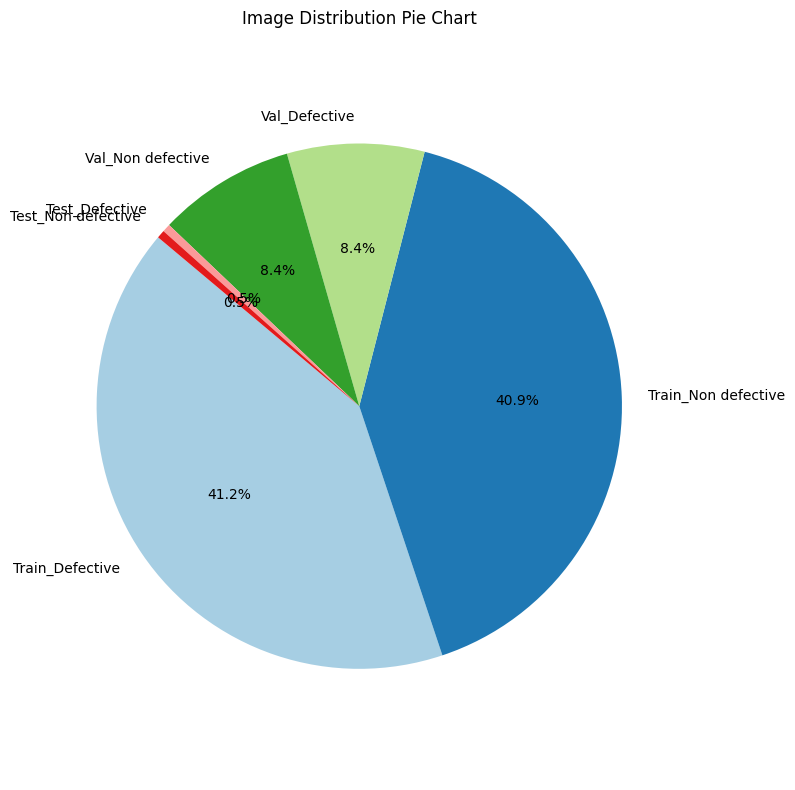

In [ ]:
# Pie Chart
plt.figure(figsize=(8, 8))
colors = plt.cm.Paired(range(len(labels)))
plt.pie(values, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title("Image Distribution Pie Chart")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()
plt.show()


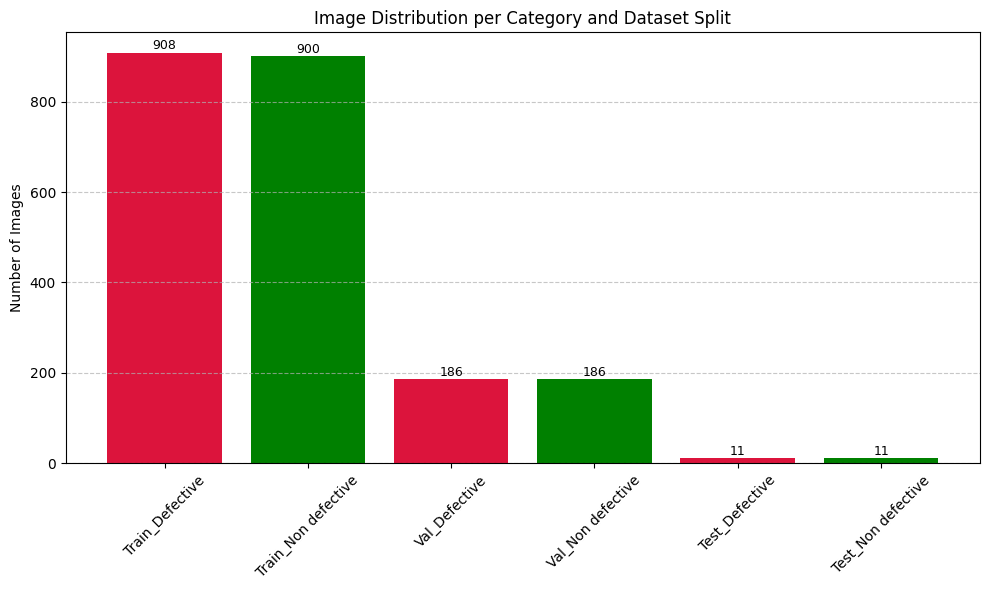

In [ ]:
import os
import matplotlib.pyplot as plt

# Path to your dataset
dataset_path = "/content/drive/MyDrive/Augmented_Dataset"

# Get dataset splits
splits = ["Train", "Val", "Test"]

# Initialize dictionary for storing counts
data_distribution = {}

# Loop through each split
for split in splits:
    split_path = os.path.join(dataset_path, split)
    if not os.path.exists(split_path):
        continue
    for category in os.listdir(split_path):
        category_path = os.path.join(split_path, category)
        if os.path.isdir(category_path):
            count = len([f for f in os.listdir(category_path) if os.path.isfile(os.path.join(category_path, f))])
            label = f"{split.capitalize()}_{category.capitalize()}"
            data_distribution[label] = count

# Plotting
labels = list(data_distribution.keys())
values = list(data_distribution.values())

plt.figure(figsize=(10, 6))
bars = plt.bar(labels, values, color=["crimson", "green"] * 3)
plt.xticks(rotation=45)
plt.ylabel("Number of Images")
plt.title("Image Distribution per Category and Dataset Split")
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate each bar with its value
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, f'{height}',
             ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


In [ ]:
import os

augmented_dataset_path = "/content/drive/MyDrive/Augmented_Dataset/Train/Defective"  # Update this

for file in os.listdir(augmented_dataset_path):
    if "2007" in file and file.endswith(".jpg"):  # Find a matching file
        new_name = "2007.jpg"  # Rename it to the expected name
        old_path = os.path.join(augmented_dataset_path, file)
        new_path = os.path.join(augmented_dataset_path, new_name)

        os.rename(old_path, new_path)
        print(f"✅ Renamed {file} → {new_name}")
        break  # Stop after renaming one file


✅ Renamed 2007.05.16_-_002_Broken_rail_weld_-_Flickr_-_faxepl (1).jpg → 2007.jpg


In [ ]:
import cv2
import os

# Function to augment an image
def augment_image(image_path, save_path, image_name):
    img = cv2.imread(image_path)

    if img is None:
        print(f"⚠️ Error reading {image_name}. Image may be missing or corrupted.")
        return

    augmentations = [
        ("_aug_flip", cv2.flip(img, 1)),  # Horizontal Flip
        ("_aug_bright", cv2.convertScaleAbs(img, alpha=1.2, beta=30)),  # Increase Brightness
        ("_aug_dark", cv2.convertScaleAbs(img, alpha=0.8, beta=-30)),  # Decrease Brightness
        ("_aug_rotate", cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)),  # Rotate
    ]

    for suffix, aug_img in augmentations:
        aug_img_name = f"{image_name}{suffix}.jpg"
        cv2.imwrite(os.path.join(save_path, aug_img_name), aug_img)

# Paths
original_path = "/content/drive/MyDrive/Railway Track fault Detection Updated/Train/Defective"
save_path = "/content/drive/MyDrive/Augmented_Dataset/Train/Defective"

# Correct filenames
matched_files = {
    "SN_RDH_GTW_BrokenRail_2": "SN_RDH_GTW_BrokenRail_2.jpg.gallery.jpg",
    "2007": [
        "2007.05.16_-_002_Broken_rail_weld_-_Flickr_-_faxepl (1).jpg",
        "2007.05.16_-_002_Broken_rail_weld_-_Flickr_-_faxepl.jpg"
    ]
}

# Augment found images
for img_name, file_names in matched_files.items():
    if isinstance(file_names, list):
        for full_name in file_names:
            image_path = os.path.join(original_path, full_name)
            augment_image(image_path, save_path, f"{img_name}_{full_name.split('.')[0]}")
    else:
        image_path = os.path.join(original_path, file_names)
        augment_image(image_path, save_path, img_name)

print("✅ Re-augmentation completed for missing images.")


✅ Re-augmentation completed for missing images.


In [ ]:
augmented_files = os.listdir(save_path)
missing_after_aug = [img for img in matched_files.keys() if not any(img in f for f in augmented_files)]

if missing_after_aug:
    print(f"⚠️ Still missing {len(missing_after_aug)} images after augmentation: {missing_after_aug}")
else:
    print("✅ All missing images have been successfully augmented!")


✅ All missing images have been successfully augmented!


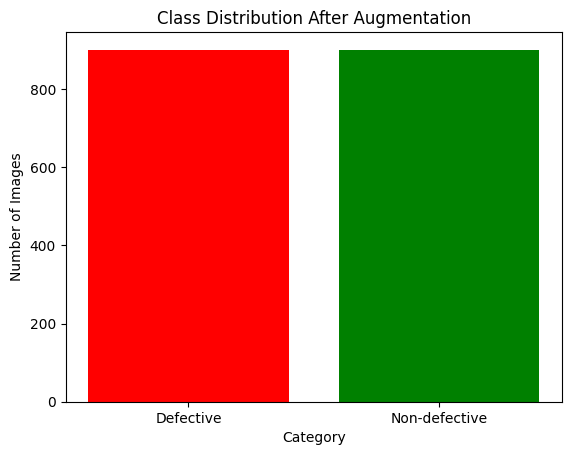

In [ ]:
import matplotlib.pyplot as plt

categories = ["Defective", "Non-defective"]
counts = [900, 900]

plt.bar(categories, counts, color=["red", "green"])
plt.xlabel("Category")
plt.ylabel("Number of Images")
plt.title("Class Distribution After Augmentation")
plt.show()


In [ ]:
import os
from collections import Counter

def check_duplicates(folder_path):
    filenames = [f for f in os.listdir(folder_path) if f.endswith((".jpg", ".png"))]
    duplicates = [item for item, count in Counter(filenames).items() if count > 1]
    return duplicates

defective_duplicates = check_duplicates("/content/drive/MyDrive/Augmented_Dataset/Train/Defective")
non_defective_duplicates = check_duplicates("/content/drive/MyDrive/Augmented_Dataset/Train/Non defective")

print("🔍 Duplicates in Defective:", defective_duplicates)
print("🔍 Duplicates in Non-defective:", non_defective_duplicates)


🔍 Duplicates in Defective: []
🔍 Duplicates in Non-defective: []


In [ ]:
import hashlib
import os

def get_image_hash(image_path):
    """Compute hash for an image file."""
    with open(image_path, "rb") as f:
        return hashlib.md5(f.read()).hexdigest()

def check_data_leakage(folder1, folder2):
    """Check if images from folder1 are present in folder2 using hashing."""
    if not os.path.exists(folder1) or not os.path.exists(folder2):
        print(f"⚠️ One of the folders does not exist: {folder1} or {folder2}")
        return

    hashes_1 = {get_image_hash(os.path.join(folder1, img)) for img in os.listdir(folder1) if img.endswith(('.jpg', '.png', '.jpeg'))}
    hashes_2 = {get_image_hash(os.path.join(folder2, img)) for img in os.listdir(folder2) if img.endswith(('.jpg', '.png', '.jpeg'))}

    common_hashes = hashes_1.intersection(hashes_2)
    if common_hashes:
        print(f"⚠️ Data Leakage Found! {len(common_hashes)} duplicate images exist between {folder1} and {folder2}.")
    else:
        print(f"✅ No data leakage detected between {folder1} and {folder2}.")

# Paths to train, validation, and test sets
train_def_path = "/content/drive/MyDrive/Augmented_Dataset/Train/Defective"
valid_def_path = "/content/drive/MyDrive/Augmented_Dataset/Validation/Defective"
test_def_path = "/content/drive/MyDrive/Augmented_Dataset/Test/Defective"

train_nondef_path = "/content/drive/MyDrive/Augmented_Dataset/Train/Non defective"
valid_nondef_path = "/content/drive/MyDrive/Augmented_Dataset/Validation/Non defective"
test_nondef_path = "/content/drive/MyDrive/Augmented_Dataset/Test/Non defective"

# Check for leaks in defective images
print("🔍 Checking Defective Images:")
check_data_leakage(train_def_path, valid_def_path)
check_data_leakage(train_def_path, test_def_path)
check_data_leakage(valid_def_path, test_def_path)

# Check for leaks in non-defective images
print("\n🔍 Checking Non-Defective Images:")
check_data_leakage(train_nondef_path, valid_nondef_path)
check_data_leakage(train_nondef_path, test_nondef_path)
check_data_leakage(valid_nondef_path, test_nondef_path)


🔍 Checking Defective Images:
✅ No data leakage detected between /content/drive/MyDrive/Augmented_Dataset/Train/Defective and /content/drive/MyDrive/Augmented_Dataset/Validation/Defective.
✅ No data leakage detected between /content/drive/MyDrive/Augmented_Dataset/Train/Defective and /content/drive/MyDrive/Augmented_Dataset/Test/Defective.
✅ No data leakage detected between /content/drive/MyDrive/Augmented_Dataset/Validation/Defective and /content/drive/MyDrive/Augmented_Dataset/Test/Defective.

🔍 Checking Non-Defective Images:
✅ No data leakage detected between /content/drive/MyDrive/Augmented_Dataset/Train/Non defective and /content/drive/MyDrive/Augmented_Dataset/Validation/Non defective.
✅ No data leakage detected between /content/drive/MyDrive/Augmented_Dataset/Train/Non defective and /content/drive/MyDrive/Augmented_Dataset/Test/Non defective.
✅ No data leakage detected between /content/drive/MyDrive/Augmented_Dataset/Validation/Non defective and /content/drive/MyDrive/Augmented_D

EDGE COMPUTING,
CLOUD COMPUTING

MANUAL FEATURE EXTRACTION

In [ ]:
import cv2
import numpy as np
import os
import pandas as pd

def extract_color_histogram(image_path, bins=(8, 8, 8)):
    """Extracts a color histogram from an image and normalizes it."""
    image = cv2.imread(image_path)
    if image is None:
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hist = cv2.calcHist([image], [0, 1, 2], None, bins, [0, 256, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    return hist.flatten()

def process_dataset(dataset_path, label):
    """Processes all images in a folder and extracts color histograms."""
    data = []
    for img_name in os.listdir(dataset_path):
        img_path = os.path.join(dataset_path, img_name)
        features = extract_color_histogram(img_path)
        if features is not None:
            data.append([img_name] + features.tolist() + [label])
    return data

# Define dataset paths
dataset_root = "/content/drive/MyDrive/Augmented_Dataset"
sets = ["Train", "Validation", "Test"]
categories = {"Defective": 1, "Non defective": 0}

# Extract features for all datasets
all_data = []
for set_name in sets:
    for category, label in categories.items():
        folder_path = os.path.join(dataset_root, set_name, category)
        all_data.extend(process_dataset(folder_path, label))

# Convert to DataFrame
columns = ["image_name"] + [f"bin_{i}" for i in range(512)] + ["label"]
df = pd.DataFrame(all_data, columns=columns)

# Save features to CSV
csv_path = "/content/drive/MyDrive/color_histogram_features.csv"
df.to_csv(csv_path, index=False)

print(f"✅ Color Histogram Features Extracted & Saved to: {csv_path}")


✅ Color Histogram Features Extracted & Saved to: /content/drive/MyDrive/color_histogram_features.csv


In [ ]:
import pandas as pd

# Load the saved color histogram features file
color_histogram_csv = "/content/drive/MyDrive/color_histogram_features.csv"
df_color_hist = pd.read_csv(color_histogram_csv)

# Display first few rows
print(df_color_hist.head())

# Check the shape (should match the total number of images)
print(f"Total Extracted Features: {df_color_hist.shape}")


                                          image_name     bin_0     bin_1  \
0  131004959_171473721383413_8222187747086021011_...  0.047623  0.000117   
1  131004959_171473721383413_8222187747086021011_...  0.014507  0.000026   
2  131004959_171473721383413_8222187747086021011_...  0.013265  0.000022   
3  131004959_171473721383413_8222187747086021011_...  0.134858  0.000056   
4  131004959_171473721383413_8222187747086021011_...  0.030628  0.011568   

     bin_2     bin_3     bin_4     bin_5  bin_6  bin_7     bin_8  ...  \
0  0.00000  0.000000  0.000000  0.000000    0.0    0.0  0.003344  ...   
1  0.00000  0.000000  0.000000  0.000000    0.0    0.0  0.000998  ...   
2  0.00000  0.000000  0.000000  0.000000    0.0    0.0  0.000903  ...   
3  0.00000  0.000000  0.000000  0.000000    0.0    0.0  0.003527  ...   
4  0.00634  0.002554  0.000556  0.000097    0.0    0.0  0.009474  ...   

    bin_503   bin_504   bin_505  bin_506   bin_507   bin_508   bin_509  \
0  0.000915  0.000000  0.00000

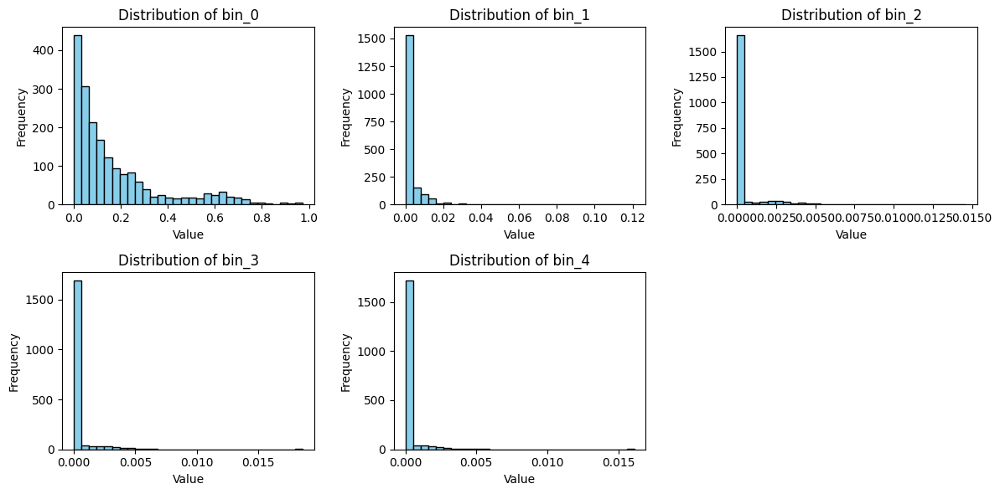

In [ ]:
import matplotlib.pyplot as plt

# Select first few feature columns to visualize
feature_columns = df_color_hist.columns[1:6]  # Skipping first column if it's an 'image name' or 'label'

plt.figure(figsize=(12, 6))
for i, col in enumerate(feature_columns):
    plt.subplot(2, 3, i+1)
    plt.hist(df_color_hist[col], bins=30, color='skyblue', edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [ ]:
import cv2
import numpy as np
import os
import pandas as pd
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops
from tqdm import tqdm  # Progress bar

# Function to extract LBP features
def extract_lbp_features(image_path, P=8, R=1):
    """Extracts LBP texture features from an image."""
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        return None  # Skip missing images

    # Compute LBP
    lbp = local_binary_pattern(image, P=P, R=R, method="uniform")

    # Compute histogram
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, P + 3), range=(0, P + 2))

    # Normalize histogram
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)

    return hist

# Function to extract GLCM features
def extract_glcm_features(image_path, distances=[1], angles=[0]):
    """Extracts GLCM texture features: contrast, correlation, energy, homogeneity."""
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        return None  # Skip missing images

    # Compute GLCM
    glcm = graycomatrix(image, distances=distances, angles=angles, levels=256, symmetric=True, normed=True)

    # Extract texture properties
    contrast = graycoprops(glcm, 'contrast').flatten()
    correlation = graycoprops(glcm, 'correlation').flatten()
    energy = graycoprops(glcm, 'energy').flatten()
    homogeneity = graycoprops(glcm, 'homogeneity').flatten()

    # Combine all features
    glcm_features = np.concatenate([contrast, correlation, energy, homogeneity])

    return glcm_features

# Path to dataset
dataset_path = "/content/drive/MyDrive/Augmented_Dataset"
sets = ["Train", "Validation", "Test"]
categories = ["Defective", "Non defective"]

# Create a list to store feature data
data = []

# Extract features for each image
for set_name in sets:
    for category in categories:
        folder_path = os.path.join(dataset_path, set_name, category)
        label = 1 if category == "Defective" else 0

        print(f"Processing {set_name}/{category}...")

        for img_name in tqdm(os.listdir(folder_path)):
            img_path = os.path.join(folder_path, img_name)

            # Extract LBP and GLCM features
            lbp_features = extract_lbp_features(img_path)
            glcm_features = extract_glcm_features(img_path)

            if lbp_features is not None and glcm_features is not None:
                data.append([img_name] + list(lbp_features) + list(glcm_features) + [label])

# Convert to DataFrame
columns = ["image_name"] + [f"lbp_feature_{i}" for i in range(10)] + \
          [f"glcm_contrast", "glcm_correlation", "glcm_energy", "glcm_homogeneity"] + ["label"]
df_features = pd.DataFrame(data, columns=columns)

# Save to CSV
save_path = "/content/drive/MyDrive/texture_features.csv"
df_features.to_csv(save_path, index=False)

print(f"✅ LBP + GLCM Features Extracted & Saved to: {save_path}")
print(f"Total Extracted Features: {df_features.shape}")


Processing Train/Defective...


100%|██████████| 908/908 [37:26<00:00,  2.47s/it]


Processing Train/Non defective...


100%|██████████| 900/900 [45:58<00:00,  3.07s/it]


Processing Validation/Defective...


100%|██████████| 31/31 [01:33<00:00,  3.03s/it]


Processing Validation/Non defective...


100%|██████████| 31/31 [01:34<00:00,  3.06s/it]


Processing Test/Defective...


100%|██████████| 11/11 [00:34<00:00,  3.13s/it]


Processing Test/Non defective...


100%|██████████| 11/11 [00:32<00:00,  3.00s/it]

✅ LBP + GLCM Features Extracted & Saved to: /content/drive/MyDrive/texture_features.csv
Total Extracted Features: (1892, 16)


In [ ]:
import pandas as pd
df = pd.read_csv("/content/drive/MyDrive/texture_features.csv")
print(df.head())  # Show first few rows
print(df.shape)  # Check total extracted features


                                          image_name  lbp_feature_0  \
0  131004959_171473721383413_8222187747086021011_...       0.074609   
1  131004959_171473721383413_8222187747086021011_...       0.054171   
2  131004959_171473721383413_8222187747086021011_...       0.051626   
3  131004959_171473721383413_8222187747086021011_...       0.076858   
4  131004959_171473721383413_8222187747086021011_...       0.123789   

   lbp_feature_1  lbp_feature_2  lbp_feature_3  lbp_feature_4  lbp_feature_5  \
0       0.089135       0.066363       0.104057       0.161253       0.113582   
1       0.092895       0.039369       0.097454       0.121975       0.112590   
2       0.091100       0.037166       0.095294       0.116353       0.111746   
3       0.088131       0.065530       0.101092       0.151775       0.108896   
4       0.105456       0.058913       0.070051       0.085205       0.074818   

   lbp_feature_6  lbp_feature_7  lbp_feature_8  lbp_feature_9  glcm_contrast  \
0       0.08

In [ ]:
print(df.isna().sum())  # Check missing values
print(df.describe())  # Check value distributions


image_name          0
lbp_feature_0       0
lbp_feature_1       0
lbp_feature_2       0
lbp_feature_3       0
lbp_feature_4       0
lbp_feature_5       0
lbp_feature_6       0
lbp_feature_7       0
lbp_feature_8       0
lbp_feature_9       0
glcm_contrast       0
glcm_correlation    0
glcm_energy         0
glcm_homogeneity    0
label               0
dtype: int64
       lbp_feature_0  lbp_feature_1  lbp_feature_2  lbp_feature_3  \
count    1892.000000    1892.000000    1892.000000    1892.000000   
mean        0.048266       0.065326       0.049566       0.119795   
std         0.040995       0.022604       0.014130       0.032914   
min         0.002890       0.015876       0.008070       0.031096   
25%         0.022476       0.048727       0.039198       0.106733   
50%         0.035173       0.062354       0.051765       0.132159   
75%         0.048267       0.072956       0.061326       0.141274   
max         0.163931       0.118409       0.076976       0.174589   

       lbp_fe

In [ ]:
import cv2
import numpy as np

def extract_edge_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply edge detectors
    edges_canny = cv2.Canny(gray, 100, 200)
    edges_sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
    edges_laplacian = cv2.Laplacian(gray, cv2.CV_64F)

    # Compute statistical features
    canny_mean = np.mean(edges_canny)
    sobel_mean = np.mean(edges_sobel)
    laplacian_mean = np.mean(edges_laplacian)

    return [canny_mean, sobel_mean, laplacian_mean]



In [ ]:
def extract_shape_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Compute Hu Moments for shape representation
    if len(contours) > 0:
        hu_moments = cv2.HuMoments(cv2.moments(contours[0])).flatten()
    else:
        hu_moments = np.zeros(7)  # If no contours, return zeros

    return hu_moments.tolist()


In [ ]:
def extract_all_features(image):
    color_features = extract_color_features(image)  # Assuming you have this function
    texture_features = extract_texture_features(image)  # Assuming you have this function
    edge_features = extract_edge_features(image)
    shape_features = extract_shape_features(image)
    fourier_features = extract_fourier_features(image)

    return color_features + texture_features + edge_features + shape_features + fourier_features


In [ ]:
import cv2
import numpy as np
import os
import pandas as pd
from concurrent.futures import ThreadPoolExecutor

# Edge-based feature extraction
def extract_edge_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges_canny = cv2.Canny(gray, 100, 200)
    edges_sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
    edges_laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    return [np.mean(edges_canny), np.mean(edges_sobel), np.mean(edges_laplacian)]

# Shape-based feature extraction (Hu Moments)
def extract_shape_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) > 0:
        hu_moments = cv2.HuMoments(cv2.moments(contours[0])).flatten()
    else:
        hu_moments = np.zeros(7)  # If no contours, return zeros
    return hu_moments.tolist()

# Fourier Transform-based feature extraction
def extract_fourier_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray, (64, 64))  # Reduce size for efficiency
    f_transform = np.fft.fft2(gray)
    f_shift = np.fft.fftshift(f_transform)
    magnitude_spectrum = 20 * np.log(np.abs(f_shift) + 1)
    return [np.mean(magnitude_spectrum), np.std(magnitude_spectrum)]

# Placeholder functions for color & texture features
def extract_color_features(image):
    return [0, 0, 0]  # Replace with actual color feature extraction

def extract_texture_features(image):
    return [0, 0]  # Replace with actual texture feature extraction

# Extract all features
def extract_all_features(image):
    color_features = extract_color_features(image)
    texture_features = extract_texture_features(image)
    edge_features = extract_edge_features(image)
    shape_features = extract_shape_features(image)
    fourier_features = extract_fourier_features(image)
    return color_features + texture_features + edge_features + shape_features + fourier_features

# Process a single image
def process_image(img_path, dataset_type, category):
    image = cv2.imread(img_path)
    if image is None:
        return None  # Skip if image can't be loaded

    image = cv2.resize(image, (128, 128))  # Resize to speed up processing
    features = extract_all_features(image)

    return [os.path.basename(img_path), dataset_type, category] + features

# Process dataset with multi-threading
def process_dataset_parallel(dataset_path):
    features_list = []
    sets = ["Train", "Validation", "Test"]
    categories = ["Defective", "Non defective"]
    image_paths = []

    for dataset_type in sets:
        for category in categories:
            folder_path = os.path.join(dataset_path, dataset_type, category)
            for filename in os.listdir(folder_path):
                img_path = os.path.join(folder_path, filename)
                image_paths.append((img_path, dataset_type, category))

    # Use ThreadPoolExecutor for parallel processing
    with ThreadPoolExecutor(max_workers=4) as executor:  # Adjust workers as needed
        results = list(executor.map(lambda x: process_image(*x), image_paths))

    # Remove None values from failed image loads
    features_list = [r for r in results if r is not None]

    # Convert to DataFrame
    columns = ["Filename", "Dataset_Type", "Label",
               "Color_1", "Color_2", "Color_3", "Texture_1", "Texture_2",
               "Canny_Mean", "Sobel_Mean", "Laplacian_Mean",
               "Hu_1", "Hu_2", "Hu_3", "Hu_4", "Hu_5", "Hu_6", "Hu_7",
               "Fourier_Mean", "Fourier_Std"]

    df = pd.DataFrame(features_list, columns=columns)

    # Save to CSV
    save_path = "rest_features.csv"
    df.to_csv(save_path, index=False)
    print(f"Feature extraction complete. Saved as '{save_path}'")

# Set dataset directory
dataset_path = "/content/drive/MyDrive/Augmented_Dataset"  # Change this path if needed

# Process and save features
process_dataset_parallel(dataset_path)


Feature extraction complete. Saved as 'rest_features.csv'


In [ ]:
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/rest_features.csv")  # Load the extracted features
print(df.head())  # Show the first 5 rows


                                            Filename Dataset_Type      Label  \
0  131004959_171473721383413_8222187747086021011_...        Train  Defective   
1  131004959_171473721383413_8222187747086021011_...        Train  Defective   
2  131004959_171473721383413_8222187747086021011_...        Train  Defective   
3  131004959_171473721383413_8222187747086021011_...        Train  Defective   
4  131004959_171473721383413_8222187747086021011_...        Train  Defective   

   Color_1  Color_2  Color_3  Texture_1  Texture_2  Canny_Mean  Sobel_Mean  \
0        0        0        0          0          0   88.341064  -23.624817   
1        0        0        0          0          0   84.107666  -22.437012   
2        0        0        0          0          0   82.987061  -20.887329   
3        0        0        0          0          0   87.578430  -21.756104   
4        0        0        0          0          0   93.648376  -10.432678   

   Laplacian_Mean  Hu_1  Hu_2  Hu_3  Hu_4  Hu_5  H

Missing values after imputation:
 Filename          0
Dataset_Type      0
Label             0
Color_1           0
Color_2           0
Color_3           0
Texture_1         0
Texture_2         0
Canny_Mean        0
Sobel_Mean        0
Laplacian_Mean    0
Hu_1              0
Hu_2              0
Hu_3              0
Hu_4              0
Hu_5              0
Hu_6              0
Hu_7              0
Fourier_Mean      0
Fourier_Std       0
dtype: int64

Class Distribution:
 Label
Defective        950
Non defective    942
Name: count, dtype: int64


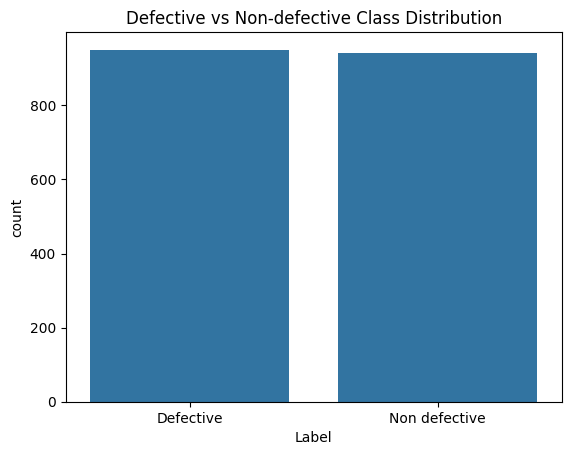

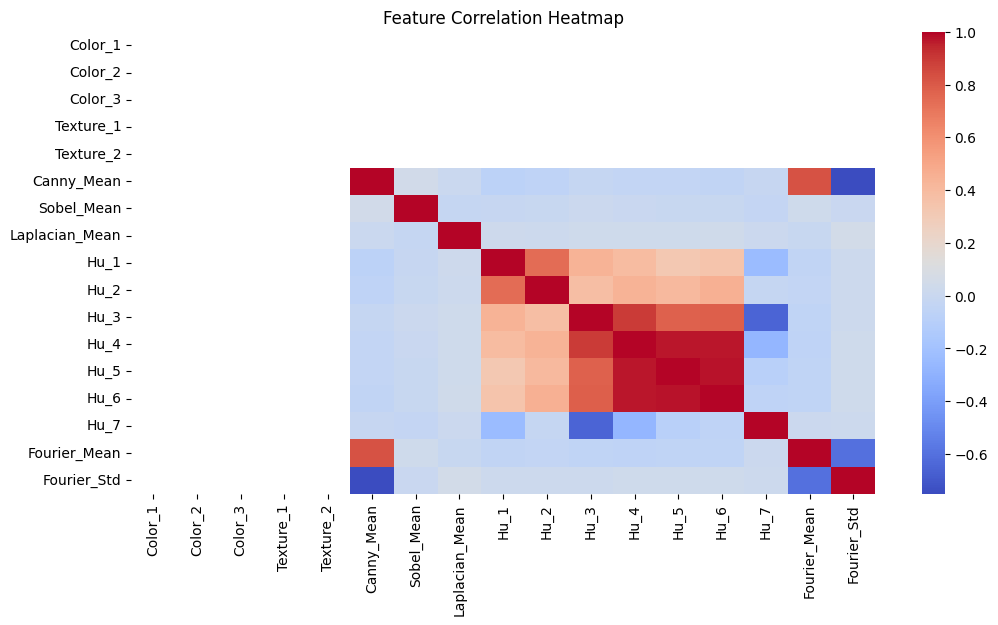


Final Features Used: Index(['Filename', 'Dataset_Type', 'Label', 'Color_1', 'Color_2', 'Color_3',
       'Texture_1', 'Texture_2', 'Canny_Mean', 'Sobel_Mean', 'Laplacian_Mean',
       'Hu_1', 'Hu_2', 'Hu_3', 'Hu_4', 'Hu_7', 'Fourier_Mean', 'Fourier_Std'],
      dtype='object')


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Load Data (Replace 'your_dataset.csv' with actual dataset)
df = pd.read_csv("/content/drive/MyDrive/rest_features.csv")

# Identify Numeric and Non-Numeric Columns
non_numeric_cols = ["Filename", "Dataset_Type", "Label"]  # Columns to exclude from numerical processing
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Handle Missing Values (Only for Numerical Columns)
imputer = SimpleImputer(strategy="mean")
df[num_cols] = imputer.fit_transform(df[num_cols])

# Verify Missing Values Are Fixed
print("Missing values after imputation:\n", df.isnull().sum())

# Feature Scaling (Only for Numerical Columns)
scaler = StandardScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])

# Class Distribution Check
print("\nClass Distribution:\n", df["Label"].value_counts())
sns.countplot(x=df["Label"])
plt.title("Defective vs Non-defective Class Distribution")
plt.show()

# Feature Correlation Analysis (Exclude Non-Numeric Columns)
plt.figure(figsize=(12, 6))
sns.heatmap(df[num_cols].corr(), annot=False, cmap="coolwarm")
plt.title("Feature Correlation Heatmap")
plt.show()

# Drop Highly Correlated Features (Threshold > 0.9)
cor_matrix = df[num_cols].corr().abs()
upper = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))
high_corr_features = [column for column in upper.columns if any(upper[column] > 0.9)]
df.drop(columns=high_corr_features, inplace=True)

print("\nFinal Features Used:", df.columns)


In [ ]:


# Verify Updated Columns
print("\nFinal Features Used:", df.columns)



Final Features Used: Index(['Label', 'Color_1', 'Color_2', 'Color_3', 'Texture_1', 'Texture_2',
       'Canny_Mean', 'Sobel_Mean', 'Laplacian_Mean', 'Hu_1', 'Hu_2', 'Hu_3',
       'Hu_4', 'Hu_7', 'Fourier_Mean', 'Fourier_Std'],
      dtype='object')


In [ ]:
import pandas as pd

# Load CSVs
color_features = pd.read_csv("/content/drive/MyDrive/color_histogram_features.csv")
texture_features = pd.read_csv("/content/drive/MyDrive/texture_features.csv")
rest_features = pd.read_csv("/content/drive/MyDrive/rest_features.csv")

# Print column names
print("Color Features Columns:", color_features.columns)
print("Texture Features Columns:", texture_features.columns)
print("Rest Features Columns:", rest_features.columns)


Color Features Columns: Index(['image_name', 'bin_0', 'bin_1', 'bin_2', 'bin_3', 'bin_4', 'bin_5',
       'bin_6', 'bin_7', 'bin_8',
       ...
       'bin_503', 'bin_504', 'bin_505', 'bin_506', 'bin_507', 'bin_508',
       'bin_509', 'bin_510', 'bin_511', 'label'],
      dtype='object', length=514)
Texture Features Columns: Index(['image_name', 'lbp_feature_0', 'lbp_feature_1', 'lbp_feature_2',
       'lbp_feature_3', 'lbp_feature_4', 'lbp_feature_5', 'lbp_feature_6',
       'lbp_feature_7', 'lbp_feature_8', 'lbp_feature_9', 'glcm_contrast',
       'glcm_correlation', 'glcm_energy', 'glcm_homogeneity', 'label'],
      dtype='object')
Rest Features Columns: Index(['Filename', 'Dataset_Type', 'Label', 'Color_1', 'Color_2', 'Color_3',
       'Texture_1', 'Texture_2', 'Canny_Mean', 'Sobel_Mean', 'Laplacian_Mean',
       'Hu_1', 'Hu_2', 'Hu_3', 'Hu_4', 'Hu_5', 'Hu_6', 'Hu_7', 'Fourier_Mean',
       'Fourier_Std'],
      dtype='object')


In [ ]:
import pandas as pd

# Load CSV files
color_features = pd.read_csv("/content/drive/MyDrive/color_histogram_features.csv")
texture_features = pd.read_csv("/content/drive/MyDrive/texture_features.csv")
rest_features = pd.read_csv("/content/drive/MyDrive/rest_features.csv")

# Rename columns for consistency
color_features.rename(columns={"image_name": "Filename", "label": "Label"}, inplace=True)
texture_features.rename(columns={"image_name": "Filename", "label": "Label"}, inplace=True)

# Drop 'Dataset_Type' from rest_features (since it's missing in other datasets)
rest_features.drop(columns=["Dataset_Type"], inplace=True)

# Ensure 'Label' columns have the same data type before merging
# Convert 'Label' in rest_features to numeric (Defective = 1, Non-defective = 0)
rest_features["Label"] = rest_features["Label"].map({"Defective": 1, "Non defective": 0})
# Convert 'Label' in merged_df (which will be created from color_features and texture_features) to numeric
color_features["Label"] = pd.to_numeric(color_features["Label"])
texture_features["Label"] = pd.to_numeric(texture_features["Label"])

# Merge datasets on 'Filename' and 'Label'
merged_df = color_features.merge(texture_features, on=["Filename", "Label"], how="inner")
merged_df = merged_df.merge(rest_features, on=["Filename", "Label"], how="inner")


# Save merged dataset
merged_df.to_csv("merged_features.csv", index=False)
print("✅ Merged dataset saved successfully!")

✅ Merged dataset saved successfully!


YOLO FEATURE EXTRACTION

In [ ]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 64.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling n

In [ ]:
import os
from PIL import Image
import torch
from torchvision import transforms
from ultralytics import YOLO
import torch.nn.functional as F
import numpy as np
from tqdm import tqdm
import pandas as pd

# Set your dataset path
DATASET_PATH = '/content/drive/MyDrive/Augmented_Dataset'  # Replace with your actual path

# Load YOLOv8 classification model
model = YOLO('yolov8n-cls.pt')
backbone = model.model.model[0]  # Backbone only (for feature extraction)

# Image preprocessing (YOLOv8 input size = 224x224)
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Define your dataset splits
splits = ['Train', 'Val']

for split in splits:
    all_features = []  # Reset for each split
    split_path = os.path.join(DATASET_PATH, split)

    if not os.path.exists(split_path):
        print(f"Split folder '{split}' not found. Skipping.")
        continue

    # Loop through 'Defective' and 'Non-defective'
    for class_name in os.listdir(split_path):
        class_folder = os.path.join(split_path, class_name)
        if not os.path.isdir(class_folder):
            continue

        # Label assignment
        label = 1 if class_name.lower() == 'defective' else 0

        for img_name in tqdm(os.listdir(class_folder), desc=f"{split}/{class_name}"):
            img_path = os.path.join(class_folder, img_name)
            try:
                img = Image.open(img_path).convert('RGB')
                input_tensor = preprocess(img).unsqueeze(0)

                with torch.no_grad():
                    features = backbone(input_tensor)
                    feature_map = features[-1]
                    pooled = F.adaptive_avg_pool2d(feature_map, (1, 1))
                    flattened = pooled.view(pooled.size(0), -1).squeeze(0).cpu().numpy()

                record = [img_path, label] + flattened.tolist()
                all_features.append(record)
            except Exception as e:
                print(f"Error processing {img_path}: {e}")

    # Save CSV for the current split
    if all_features:
        columns = ['image_path', 'label'] + [f'feat_{i}' for i in range(len(all_features[0]) - 2)]
        df = pd.DataFrame(all_features, columns=columns)
        csv_name = f'yolov8_features_{split.lower()}.csv'
        df.to_csv(csv_name, index=False)
        print(f"Saved features for {split} to {csv_name}")
    else:
        print(f"No features extracted for {split}")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.31M/5.31M [00:00<00:00, 64.8MB/s]
Train/Non defective: 100%|██████████| 900/900 [03:27<00:00,  4.35it/s]


Saved features for Train to yolov8_features_train.csv


Val/Non defective: 100%|██████████| 186/186 [00:42<00:00,  4.42it/s]


Saved features for Val to yolov8_features_val.csv


In [ ]:
import pandas as pd

# Load the YOLO-extracted feature CSV
yolo_features_df = pd.read_csv('/content/drive/MyDrive/yolov8_features_train.csv')

# Print the shape of the dataset
print("Shape of YOLO features:", yolo_features_df.shape)

# Print the column names
print("Feature Names:")
print(yolo_features_df.columns.tolist())

# Preview the first few rows
print("First 5 rows:")
print(yolo_features_df.head())


Shape of YOLO features: (1808, 18)
Feature Names:
['image_path', 'label', 'feat_0', 'feat_1', 'feat_2', 'feat_3', 'feat_4', 'feat_5', 'feat_6', 'feat_7', 'feat_8', 'feat_9', 'feat_10', 'feat_11', 'feat_12', 'feat_13', 'feat_14', 'feat_15']
First 5 rows:
                                          image_path  label  \
0  /content/drive/MyDrive/Augmented_Dataset/Train...      1   
1  /content/drive/MyDrive/Augmented_Dataset/Train...      1   
2  /content/drive/MyDrive/Augmented_Dataset/Train...      1   
3  /content/drive/MyDrive/Augmented_Dataset/Train...      1   
4  /content/drive/MyDrive/Augmented_Dataset/Train...      1   

                 feat_0                feat_1                feat_2  \
0   [2.924248218536377]  [0.9954755902290344]  [0.8047056198120117]   
1  [3.1605732440948486]  [1.2823110818862915]  [0.7009523510932922]   
2   [3.142881393432617]  [1.2692289352416992]  [0.6900939345359802]   
3  [2.9014017581939697]  [0.9646861553192139]  [0.8052681684494019]   
4  [2.793444

In [ ]:
import pandas as pd
import ast

# Load YOLO features
df = pd.read_csv("/content/drive/MyDrive/yolov8features.csv")

# Convert list-like strings to float
for col in df.columns[2:]:
    df[col] = df[col].apply(lambda x: ast.literal_eval(x)[0] if isinstance(x, str) else x)

# Confirm the cleaned feature shape
print("New shape:", df.shape)
print("Feature preview:")
print(df.head())


New shape: (2180, 18)
Feature preview:
                                          image_path  label    feat_0  \
0  /content/drive/MyDrive/Augmented_Dataset/Train...      1  2.924248   
1  /content/drive/MyDrive/Augmented_Dataset/Train...      1  3.160573   
2  /content/drive/MyDrive/Augmented_Dataset/Train...      1  3.142881   
3  /content/drive/MyDrive/Augmented_Dataset/Train...      1  2.901402   
4  /content/drive/MyDrive/Augmented_Dataset/Train...      1  2.793444   

     feat_1    feat_2    feat_3    feat_4    feat_5    feat_6    feat_7  \
0  0.995476  0.804706 -0.048592  0.653774  0.754113  2.897405  9.151835   
1  1.282311  0.700952  0.812088  0.529920  0.724012  3.046422  9.257462   
2  1.269229  0.690094  0.880993  0.529895  0.724284  3.017067  9.262045   
3  0.964686  0.805268 -0.049866  0.670334  0.763615  2.888750  9.215718   
4  0.972328  0.611854 -0.123014  0.695303  1.003155  2.737730  9.164314   

     feat_8        feat_9   feat_10   feat_11   feat_12   feat_13   fea

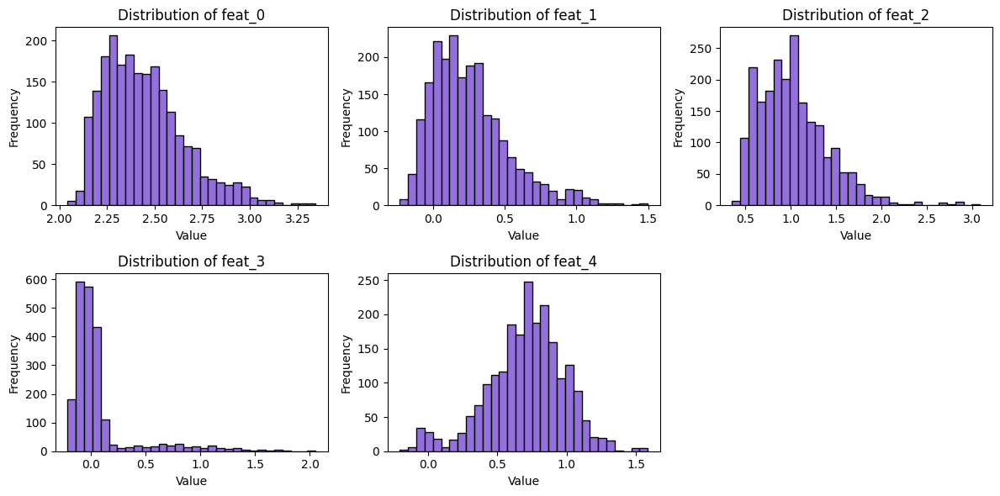

In [ ]:
import matplotlib.pyplot as plt

# Visualize first 5 feature columns
feature_cols = df.columns[2:7]  # Adjust range as needed

plt.figure(figsize=(12, 6))
for i, col in enumerate(feature_cols):
    plt.subplot(2, 3, i + 1)
    plt.hist(df[col], bins=30, color='mediumpurple', edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xlabel("Value")
    plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


MANUAL FEATURE EXTRACTION

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from skimage.feature import graycomatrix, graycoprops, canny # Updated import
from skimage.color import rgb2gray
from tqdm import tqdm

def extract_features_from_image(image_path):
    image = cv2.imread(image_path)
    image_resized = cv2.resize(image, (224, 224))

    gray = cv2.cvtColor(image_resized, cv2.COLOR_BGR2GRAY)

    # GLCM Texture Features
    # Changed 'greycomatrix' to 'graycomatrix'
    glcm = graycomatrix(gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0, 0] # Changed 'greycoprops' to 'graycoprops'
    dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0] # Changed 'greycoprops' to 'graycoprops'
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0] # Changed 'greycoprops' to 'graycoprops'
    energy = graycoprops(glcm, 'energy')[0, 0] # Changed 'greycoprops' to 'graycoprops'

    # RGB Mean Features
    r_mean = np.mean(image_resized[:, :, 2])
    g_mean = np.mean(image_resized[:, :, 1])
    b_mean = np.mean(image_resized[:, :, 0])

    # Edge Feature (Canny)
    edges = canny(rgb2gray(image_resized))
    edge_sum = np.sum(edges)

    # Color Histogram (Reduced: 4 bins per channel)
    hist_b = cv2.calcHist([image_resized], [0], None, [4], [0, 256]).flatten()
    hist_g = cv2.calcHist([image_resized], [1], None, [4], [0, 256]).flatten()
    hist_r = cv2.calcHist([image_resized], [2], None, [4], [0, 256]).flatten()
    color_hist = np.concatenate([hist_r, hist_g, hist_b])

    features = [contrast, dissimilarity, homogeneity, energy,
                r_mean, g_mean, b_mean,
                edge_sum] + color_hist.tolist()
    return features

def process_directory(base_path):
    data = []
    labels = []

    for label in ['Defective', 'Non defective']:
        folder = os.path.join(base_path, label)
        for filename in tqdm(os.listdir(folder), desc=f"Processing {label}"):
            file_path = os.path.join(folder, filename)
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                features = extract_features_from_image(file_path)
                data.append(features)
                labels.append(label)

    df = pd.DataFrame(data)
    df['label'] = labels
    return df

# Update your dataset paths here
train_dir = "/content/drive/MyDrive/Augmented_Dataset/Train"
val_dir = "/content/drive/MyDrive/Augmented_Dataset/Val"

train_df = process_directory(train_dir)
val_df = process_directory(val_dir)

train_df.to_csv("/content/train_manual_features.csv", index=False)
val_df.to_csv("/content/val_manual_features.csv", index=False)

print("Manual feature extraction complete with reduced histogram bins.")

Processing Non defective: 100%|██████████| 186/186 [00:41<00:00,  4.44it/s]


Manual feature extraction complete with reduced histogram bins.


MERGING BOTH CSV FILES

In [ ]:
import pandas as pd
import ast

# Load YOLO features
df = pd.read_csv("/content/drive/MyDrive/train_manual_features.csv")

# Convert list-like strings to float (excluding the 'label' column)
for col in df.columns[:-1]:  # Exclude the last column ('label')
    try:  # Wrap in try-except to handle potential errors during conversion
        df[col] = df[col].apply(lambda x: ast.literal_eval(x)[0] if isinstance(x, str) else x)
    except (SyntaxError, ValueError):
        print(f"Warning: Could not convert column '{col}' using ast.literal_eval()")

# Confirm the cleaned feature shape
print("New shape:", df.shape)
print("Feature preview:")
print(df.head())

New shape: (1807, 21)
Feature preview:
             0          1         2         3           4           5  \
0  1858.197950  30.517257  0.044252  0.008169  158.050761  153.181979   
1  2699.712464  33.289017  0.165970  0.081296  206.046158  202.039760   
2  2688.601698  32.678011  0.187321  0.097091  209.203045  205.276806   
3  1825.795824  29.967429  0.059956  0.013254  155.570492  150.763791   
4  2430.098595  36.030369  0.034944  0.008030  166.607801  166.182438   

            6      7       8        9  ...       11      12       13       14  \
0  139.639349  14734  2027.0  12134.0  ...  15636.0  2557.0  12602.0  21377.0   
1  184.918308  13861   923.0   4481.0  ...  33298.0  1210.0   6042.0  10462.0   
2  188.145309  13715   857.0   4093.0  ...  34428.0  1131.0   5520.0   9976.0   
3  137.527623  14572  2865.0  11862.0  ...  15496.0  3360.0  12440.0  20863.0   
4  153.738799  16200  1157.0   8922.0  ...  17383.0  1383.0  10056.0  20151.0   

        15      16       17       1

In [ ]:
import pandas as pd

# Load your manual features dataset
manual_df = pd.read_csv('/content/drive/MyDrive/train_manual_features.csv')

# Convert labels to 0 (Non Defective) / 1 (Defective)
manual_df['label'] = manual_df['label'].map({'Defective': 1, 'Non defective': 0})

# Handle NaN values before converting to integers
# Replace NaN values with a suitable value, like -1 or the most frequent label
manual_df['label'] = manual_df['label'].fillna(-1).astype(int)

# Save the updated DataFrame back to the same CSV file
manual_df.to_csv('/content/drive/MyDrive/train_manual_features.csv', index=False)

In [ ]:
import pandas as pd

# Load your manual features dataset
manual_df = pd.read_csv('/content/drive/MyDrive/val_manual_features.csv')

# Convert labels to 0 (Non Defective) / 1 (Defective)
manual_df['label'] = manual_df['label'].map({'Defective': 1, 'Non defective': 0})

# Handle NaN values before converting to integers
# Replace NaN values with a suitable value, like -1 or the most frequent label
manual_df['label'] = manual_df['label'].fillna(-1).astype(int)

# Save the updated DataFrame back to the same CSV file
manual_df.to_csv('/content/drive/MyDrive/val_manual_features.csv', index=False)

In [ ]:
import os
from glob import glob

# Check image format
image_paths = glob('/content/drive/MyDrive/Augmented_Dataset/Train/**/*.jpg', recursive=True)
print(f"Found {len(image_paths)} JPG images")

# Also check for .png or .jpeg
image_paths_png = glob('/content/drive/MyDrive/Augmented_Dataset/Train/**/*.png', recursive=True)
image_paths_jpeg = glob('/content/drive/MyDrive/Augmented_Dataset/Train/**/*.jpeg', recursive=True)
print(f"Found {len(image_paths_png)} PNG images")
print(f"Found {len(image_paths_jpeg)} JPEG images")


Found 1792 JPG images
Found 0 PNG images
Found 15 JPEG images


In [ ]:
from glob import glob

# Gather all image paths (.jpg and .jpeg)
image_paths = sorted(
    glob('/content/drive/MyDrive/Augmented_Dataset/Train/**/*.jpg', recursive=True) +
    glob('/content/drive/MyDrive/Augmented_Dataset/Train/**/*.jpeg', recursive=True)
)

# Confirm count matches
print("Total image paths found:", len(image_paths))
assert len(image_paths) == len(manual_df), "Mismatch after including JPEGs!"

# Assign image paths to the manual features DataFrame
manual_df.insert(0, 'image_path', image_paths)
print("✅ Image paths successfully added to manual_df")
manual_df.to_csv('manual_features_with_path.csv', index=False)

In [ ]:
manual_df.to_csv('manual_features_with_path.csv', index=False)

In [ ]:
# Load YOLO features
yolo_df = pd.read_csv('/content/drive/MyDrive/yolov8_features_train.csv')  # replace with correct filename

# Load updated manual features
manual_df = pd.read_csv('/content/drive/MyDrive/manual_features_with_path.csv')

# Merge on image_path
merged_df = pd.merge(manual_df, yolo_df, on='image_path', suffixes=('_manual', '_yolo'))

# Drop duplicate label column if needed
merged_df = merged_df.drop(columns=['label_yolo'])  # keep only one label

# Rename cleanly
merged_df = merged_df.rename(columns={'label_manual': 'label'})


In [ ]:
print(f"Final shape: {merged_df.shape}")
print("Preview:")
print(merged_df.head())


Final shape: (1807, 38)
Preview:
                                          image_path            0          1  \
0  /content/drive/MyDrive/Augmented_Dataset/Train...  1858.197950  30.517257   
1  /content/drive/MyDrive/Augmented_Dataset/Train...  2699.712464  33.289017   
2  /content/drive/MyDrive/Augmented_Dataset/Train...  2688.601698  32.678011   
3  /content/drive/MyDrive/Augmented_Dataset/Train...  1825.795824  29.967429   
4  /content/drive/MyDrive/Augmented_Dataset/Train...  2430.098595  36.030369   

          2         3           4           5           6      7       8  ...  \
0  0.044252  0.008169  158.050761  153.181979  139.639349  14734  2027.0  ...   
1  0.165970  0.081296  206.046158  202.039760  184.918308  13861   923.0  ...   
2  0.187321  0.097091  209.203045  205.276806  188.145309  13715   857.0  ...   
3  0.059956  0.013254  155.570492  150.763791  137.527623  14572  2865.0  ...   
4  0.034944  0.008030  166.607801  166.182438  153.738799  16200  1157.0  ...   


In [ ]:
merged_df.to_csv('train_merged_features.csv', index=False)


In [ ]:
from glob import glob

# Load manual features
manual_df = pd.read_csv('/content/drive/MyDrive/val_manual_features.csv')

# Get the image paths — ensure they are sorted in same order used in manual feature extraction
image_paths = sorted(glob('/content/drive/MyDrive/Augmented_Dataset/Val/*/*.jpg'))

# Check if the number of image paths matches the manual features
assert len(image_paths) == len(manual_df), "Mismatch in number of image paths and manual features!"

# Add image path to manual_df
manual_df.insert(0, 'image_path', image_paths)

# Save if needed
manual_df.to_csv('val_manual_features_with_path.csv', index=False)


In [ ]:
# Load YOLO features
yolo_df = pd.read_csv('/content/drive/MyDrive/yolov8_features_val.csv')  # replace with correct filename

# Load updated manual features
manual_df = pd.read_csv('/content/drive/MyDrive/val_manual_features_with_path.csv')

# Merge on image_path
merged_df = pd.merge(manual_df, yolo_df, on='image_path', suffixes=('_manual', '_yolo'))

# Drop duplicate label column if needed
merged_df = merged_df.drop(columns=['label_yolo'])  # keep only one label

# Rename cleanly
merged_df = merged_df.rename(columns={'label_manual': 'label'})


In [ ]:
print(f"Final shape: {merged_df.shape}")
print("Preview:")
print(merged_df.head())
merged_df.to_csv('val_merged_features.csv', index=False)

Final shape: (372, 38)
Preview:
                                          image_path            0          1  \
0  /content/drive/MyDrive/Augmented_Dataset/Val/D...  1561.149103  25.292000   
1  /content/drive/MyDrive/Augmented_Dataset/Val/D...  1774.024123  26.918942   
2  /content/drive/MyDrive/Augmented_Dataset/Val/D...  2170.029148  28.110306   
3  /content/drive/MyDrive/Augmented_Dataset/Val/D...  1605.463565  25.521821   
4  /content/drive/MyDrive/Augmented_Dataset/Val/D...  2094.188941  28.546084   

          2         3           4           5           6      7        8  \
0  0.067646  0.008964  125.213927  120.870297  112.104353  11809  11717.0   
1  0.063367  0.008463  133.262875  128.816048  119.351323  11944  10391.0   
2  0.120494  0.035883  156.505022  153.911093  145.567921  11685   7016.0   
3  0.066746  0.008928  124.738321  120.413345  111.681521  12043  11935.0   
4  0.080386  0.014025  148.219946  144.571688  134.926778  11990   8105.0   

   ...                fe

TRAINING USING  RANDOM FOREST


In [ ]:
import pandas as pd

# Load your CSV
df = pd.read_csv("/content/drive/MyDrive/yolov8features.csv")  # or yolov8_deep_features.csv

# Split features and labels
X = df.drop('label', axis=1)
y = df['label']


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Load Data
df = pd.read_csv("/content/drive/MyDrive/train_merged_features.csv")

# Assuming 'df' is your DataFrame with features and labels
X = df.drop(['label', 'image_path'], axis=1)  # Drop 'label' and 'image_path' for scaling
y = df['label']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Convert list-like strings to float in X_train and X_test
for col in X_train.columns:
    if X_train[col].dtype == 'object':  # Check if column is of object type (string)
        try:
            X_train[col] = X_train[col].apply(lambda x: float(x.strip('[]')) if isinstance(x, str) else x)
            X_test[col] = X_test[col].apply(lambda x: float(x.strip('[]')) if isinstance(x, str) else x)
        except (ValueError, AttributeError):
            print(f"Warning: Could not convert values in column '{col}' to float. Skipping.")

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Scale only numerical features
X_test_scaled = scaler.transform(X_test)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(
    n_estimators=200,      # number of trees
    max_depth=15,          # control tree depth
    random_state=42,
    class_weight='balanced'  # handles imbalance
)
rf.fit(X_train_scaled, y_train)


RandomForestClassifier(class_weight='balanced', max_depth=15, n_estimators=200,
                       random_state=42)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

y_pred = rf.predict(X_test_scaled)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Accuracy: 0.9751381215469613

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.98      0.98       180
           1       0.98      0.97      0.98       182

    accuracy                           0.98       362
   macro avg       0.98      0.98      0.98       362
weighted avg       0.98      0.98      0.98       362


Confusion Matrix:
 [[176   4]
 [  5 177]]


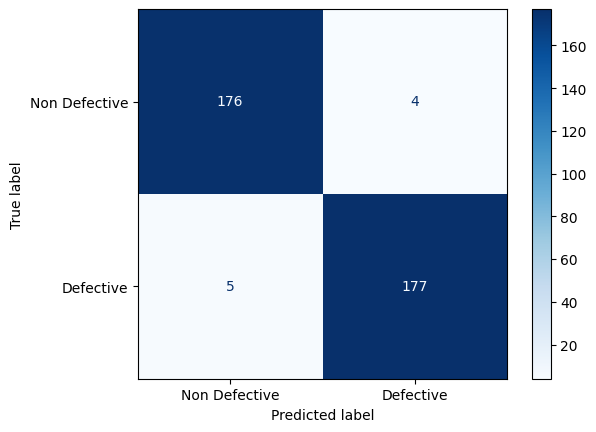

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
# Assuming y_true and y_pred are your true and predicted labels
cm = confusion_matrix(y_test, y_pred)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non Defective", "Defective"])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [ ]:
import joblib
joblib.dump(model, 'random_forest_model.pkl')


['random_forest_model.pkl']

In [ ]:
joblib.dump(scaler, 'scaler.pkl')

['scaler.pkl']

EDGE COMPUTING

In [ ]:
import joblib
import numpy as np
import requests
import torch
import cv2
from PIL import Image
from torchvision import transforms
from ultralytics import YOLO
import torch.nn.functional as F
from skimage.feature import graycomatrix, graycoprops, canny
from skimage.color import rgb2gray

# --- Load Trained Artifacts ---
model = joblib.load('random_forest_model.pkl')       # Trained classifier
scaler = joblib.load('scaler.pkl')                   # Trained StandardScaler

# --- Load YOLOv8 Backbone ---
yolo_model = YOLO('yolov8n-cls.pt')
backbone = yolo_model.model.model[0]  # Use only the backbone

# --- Image Preprocessing ---
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])


# --- YOLOv8 Feature Extractor (15-dim assumed) ---
def extract_yolo_features(image_path):
    img = Image.open(image_path).convert('RGB')
    input_tensor = preprocess(img).unsqueeze(0)
    with torch.no_grad():
        features = backbone(input_tensor)
        feature_map = features[-1]
        pooled = F.adaptive_avg_pool2d(feature_map, (1, 1))
        flattened = pooled.view(pooled.size(0), -1).squeeze(0).cpu().numpy()
    return flattened.tolist()


# --- Manual Feature Extractor (20-dim assumed) ---
def extract_manual_features(image_path):
    image = cv2.imread(image_path)
    image_resized = cv2.resize(image, (224, 224))

    gray = cv2.cvtColor(image_resized, cv2.COLOR_BGR2GRAY)

    # GLCM Features
    glcm = graycomatrix(gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
    energy = graycoprops(glcm, 'energy')[0, 0]

    # RGB Means
    r_mean = np.mean(image_resized[:, :, 2])
    g_mean = np.mean(image_resized[:, :, 1])
    b_mean = np.mean(image_resized[:, :, 0])

    # Canny Edge Sum
    edges = canny(rgb2gray(image_resized))
    edge_sum = np.sum(edges)

    # Color Histogram (4 bins per channel)
    hist_b = cv2.calcHist([image_resized], [0], None, [4], [0, 256]).flatten()
    hist_g = cv2.calcHist([image_resized], [1], None, [4], [0, 256]).flatten()
    hist_r = cv2.calcHist([image_resized], [2], None, [4], [0, 256]).flatten()
    color_hist = np.concatenate([hist_r, hist_g, hist_b])

    features = [
        contrast, dissimilarity, homogeneity, energy,
        r_mean, g_mean, b_mean, edge_sum
    ] + color_hist.tolist()

    return features


# --- Edge Inference Function ---
def edge_inference(image_path):
    try:
        yolo_feats = extract_yolo_features(image_path)
        manual_feats = extract_manual_features(image_path)

        combined_feats = np.array(yolo_feats + manual_feats).reshape(1, -1)
        scaled_feats = scaler.transform(combined_feats)

        prediction = model.predict(scaled_feats)[0]
        confidence = float(np.max(model.predict_proba(scaled_feats)))

        data_to_send = {
            'image_path': image_path,
            'prediction': int(prediction),
            'confidence': confidence
        }

        # Send to cloud (modify the URL to match your server)
        response = requests.post("http://your-cloud-api/predict", json=data_to_send)

        return response.json()

    except Exception as e:
        return {"error": str(e)}


In [ ]:
result = edge_inference('/path/to/image.jpg')
print(result)


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import ast  # Import ast for literal_eval

# Load CSV
df = pd.read_csv("/content/drive/MyDrive/yolov8features.csv")  # or yolov8_deep_features.csv

# Separate features and target
X = df.drop(['label', 'image_path'], axis=1)  # Drop 'image_path' along with 'label'
y = df['label']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Convert list-like strings to float in X_train and X_test
for col in X_train.columns:
    if X_train[col].dtype == 'object':  # Check if column is of object type (string)
        try:
            # Use ast.literal_eval to safely evaluate the string as a Python literal
            X_train[col] = X_train[col].apply(lambda x: ast.literal_eval(x)[0] if isinstance(x, str) else x)
            X_test[col] = X_test[col].apply(lambda x: ast.literal_eval(x)[0] if isinstance(x, str) else x)
        except (ValueError, AttributeError, SyntaxError):
            print(f"Warning: Could not convert values in column '{col}' to float. Skipping.")

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],
    'max_features': ['sqrt', 'log2']
}

# Initialize base model
rf = RandomForestClassifier(random_state=42, class_weight='balanced')

# Grid search
grid_search = GridSearchCV(estimator=rf,
                           param_grid=param_grid,
                           cv=5,
                           scoring='accuracy',
                           n_jobs=-1,
                           verbose=2)

# Fit the model
grid_search.fit(X_train_scaled, y_train)


Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, None],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200]},
             scoring='accuracy', verbose=2)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Best estimator
best_rf = grid_search.best_estimator_
print("Best Parameters:", grid_search.best_params_)

# Predict
y_pred = best_rf.predict(X_test_scaled)

# Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Best Parameters: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 100}
Accuracy: 0.8807339449541285

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.91      0.88       217
           1       0.91      0.85      0.88       219

    accuracy                           0.88       436
   macro avg       0.88      0.88      0.88       436
weighted avg       0.88      0.88      0.88       436


Confusion Matrix:
 [[198  19]
 [ 33 186]]


In [ ]:
pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 64.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 70.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [ ]:
import os
import shutil

# Your current folder where images are already divided into class subfolders
source_dir = '/content/drive/MyDrive/Augmented_Dataset'
target_dir = 'dataset'
splits = ['Train', 'Val']  # or ['train', 'val'] depending on your naming

label_map = {
    'Defective': 'defective',
    'Non defective': 'non_defective'
}

for split in splits:
    split_src = os.path.join(source_dir, split)

    for class_folder in os.listdir(split_src):
        class_path = os.path.join(split_src, class_folder)
        if not os.path.isdir(class_path):
            continue  # skip if not a folder

        label = label_map.get(class_folder, class_folder.lower())

        # Destination folder
        dst_folder = os.path.join(target_dir, split.lower(), label)
        os.makedirs(dst_folder, exist_ok=True)

        for img_file in os.listdir(class_path):
            src_img_path = os.path.join(class_path, img_file)
            dst_img_path = os.path.join(dst_folder, img_file)

            if os.path.isfile(src_img_path):
                shutil.copy(src_img_path, dst_img_path)

print("✅ Dataset reformatted for YOLOv8 classification.")


✅ Dataset reformatted for YOLOv8 classification.


In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8s-cls.pt')  # Use yolov8s/m/l for better accuracy

model.train(data='dataset',
            epochs=20,
            imgsz=224,
            batch=16)


Ultralytics 8.3.128 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=False

train: Scanning /content/dataset/train... 1808 images, 0 corrupt: 100%|██████████| 1808/1808 [00:00<?, ?it/s]

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 676.8±1172.9 MB/s, size: 5582.5 KB)



val: Scanning /content/dataset/val... 372 images, 0 corrupt: 100%|██████████| 372/372 [00:00<?, ?it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 26 weight(decay=0.0), 27 weight(decay=0.0005), 27 bias(decay=0.0)
Image sizes 224 train, 224 val
Using 0 dataloader workers
Logging results to runs/classify/train4
Starting training for 20 epochs...

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [02:00<00:00, 10.03s/it]

                   all     0.0457          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:41<00:00,  8.49s/it]

                   all      0.043          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:40<00:00,  8.40s/it]

                   all     0.0645          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:43<00:00,  8.62s/it]

                   all     0.0188          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:41<00:00,  8.49s/it]

                   all      0.043          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:45<00:00,  8.81s/it]

                   all     0.0833          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:39<00:00,  8.30s/it]

                   all     0.0269          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:41<00:00,  8.42s/it]

                   all     0.0672          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:38<00:00,  8.19s/it]

                   all     0.0323          1



      Epoch    GPU_mem       loss  Instances       Size


      10/20         0G    0.05247         16        224: 100%|██████████| 113/113 [10:16<00:00,  5.45s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:40<00:00,  8.39s/it]

                   all     0.0269          1



      Epoch    GPU_mem       loss  Instances       Size


      11/20         0G    0.05075         16        224: 100%|██████████| 113/113 [10:22<00:00,  5.51s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:39<00:00,  8.33s/it]

                   all     0.0457          1



      Epoch    GPU_mem       loss  Instances       Size


      12/20         0G    0.04671         16        224: 100%|██████████| 113/113 [10:13<00:00,  5.43s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:38<00:00,  8.17s/it]

                   all      0.043          1



      Epoch    GPU_mem       loss  Instances       Size


      13/20         0G    0.03674         16        224: 100%|██████████| 113/113 [10:11<00:00,  5.41s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:40<00:00,  8.41s/it]

                   all     0.0457          1



      Epoch    GPU_mem       loss  Instances       Size


      14/20         0G    0.02015         16        224: 100%|██████████| 113/113 [10:11<00:00,  5.41s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:37<00:00,  8.14s/it]

                   all     0.0511          1



      Epoch    GPU_mem       loss  Instances       Size


      15/20         0G    0.02101         16        224: 100%|██████████| 113/113 [10:14<00:00,  5.43s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:37<00:00,  8.17s/it]

                   all     0.0618          1



      Epoch    GPU_mem       loss  Instances       Size


      16/20         0G    0.02385         16        224: 100%|██████████| 113/113 [10:25<00:00,  5.54s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:37<00:00,  8.16s/it]

                   all      0.043          1



      Epoch    GPU_mem       loss  Instances       Size


      17/20         0G    0.02462         16        224: 100%|██████████| 113/113 [10:13<00:00,  5.43s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:43<00:00,  8.63s/it]

                   all     0.0484          1



      Epoch    GPU_mem       loss  Instances       Size


      18/20         0G    0.01765         16        224: 100%|██████████| 113/113 [10:18<00:00,  5.48s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:41<00:00,  8.43s/it]

                   all     0.0403          1



      Epoch    GPU_mem       loss  Instances       Size


      19/20         0G    0.01579         16        224: 100%|██████████| 113/113 [10:19<00:00,  5.48s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 12/12 [01:39<00:00,  8.25s/it]

                   all     0.0349          1



      Epoch    GPU_mem       loss  Instances       Size


      20/20         0G    0.01085         16        224:  86%|████████▌ | 97/113 [08:59<01:34,  5.91s/it]

In [ ]:
from ultralytics import YOLO
from sklearn.metrics import accuracy_score
import os

# 1. Load the trained best model
model = YOLO('/content/runs/classify/train4/weights/best.pt')

# 2. Predict on validation set with streaming
results = model.predict(source='dataset/val', imgsz=224, stream=True)

# 3. Extract true and predicted labels
y_true = []
y_pred = []

for r in results:
    # True label from folder name
    true_label = os.path.basename(os.path.dirname(r.path))
    pred_label = r.names[r.probs.top1]

    y_true.append(true_label)
    y_pred.append(pred_label)

# 4. Compute and print accuracy
acc = accuracy_score(y_true, y_pred)
print(f"✅ YOLOv8 Classification Accuracy on Validation Set: {acc:.4f}")


FileNotFoundError: No images or videos found in dataset/val. Supported formats are:
images: {'png', 'jpg', 'jpeg', 'heic', 'tif', 'tiff', 'mpo', 'webp', 'dng', 'bmp', 'pfm'}
videos: {'avi', 'asf', 'webm', 'mpg', 'mpeg', 'ts', 'mov', 'mkv', 'wmv', 'm4v', 'mp4', 'gif'}

In [ ]:
# 1. Load the trained best model
model = YOLO('/content/runs/classify/train4/weights/best.pt')

# 2. Predict on validation set with streaming
results = model.predict(source='dataset/val', imgsz=224, stream=True)  # Add imgsz=224 and specify the correct path

# 3. Extract true and predicted labels
y_true = []
y_pred = []

for r in results:
    # True label from folder name
    true_label = os.path.basename(os.path.dirname(r.path))
    pred_label = r.names[r.probs.top1]

    y_true.append(true_label)
    y_pred.append(pred_label)

# 4. Compute and print accuracy
acc = accuracy_score(y_true, y_pred)
print(f"✅ YOLOv8 Classification Accuracy on Validation Set: {acc:.4f}")

FileNotFoundError: No images or videos found in dataset/val. Supported formats are:
images: {'png', 'jpg', 'jpeg', 'heic', 'tif', 'tiff', 'mpo', 'webp', 'dng', 'bmp', 'pfm'}
videos: {'avi', 'asf', 'webm', 'mpg', 'mpeg', 'ts', 'mov', 'mkv', 'wmv', 'm4v', 'mp4', 'gif'}

In [ ]:
# Separate features (X) and target (y)
X = merged_df.drop(columns=['label'])  # Features
y = merged_df['label']  # Target

# Check the shapes of X and y
print(f"Features shape: {X.shape}, Target shape: {y.shape}")


Features shape: (1892, 562), Target shape: (1892,)


In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the shapes of the training and testing sets
print(f"Train set shape: {X_train.shape}, Test set shape: {X_test.shape}")


Train set shape: (1513, 562), Test set shape: (379, 562)


In [ ]:
# Remove 'Filename' column from the data
X_train = X_train.drop(columns=['Filename'])
X_test = X_test.drop(columns=['Filename'])

# Verify that 'Filename' is removed
print(X_train.head())


         bin_0         bin_1     bin_2    bin_3     bin_4    bin_5     bin_6  \
339   0.083936  3.311583e-04  0.000000  0.00000  0.000000  0.00000  0.000000   
567   0.046278  1.445915e-02  0.009105  0.00414  0.001249  0.00022  0.000022   
543   0.087873  0.000000e+00  0.000000  0.00000  0.000000  0.00000  0.000000   
1253  0.129465  3.686622e-04  0.000000  0.00000  0.000000  0.00000  0.000000   
620   0.617033  3.116500e-07  0.000000  0.00000  0.000000  0.00000  0.000000   

      bin_7     bin_8         bin_9  ...    feat_6    feat_7    feat_8  \
339     0.0  0.002510  2.410515e-03  ...  0.938404  0.250362 -0.321344   
567     0.0  0.014323  1.042445e-02  ...  2.193683  1.033810 -0.312630   
543     0.0  0.000013  0.000000e+00  ... -0.176814  0.878417 -0.323966   
1253    0.0  0.005311  2.361095e-03  ...  0.095236 -0.153929 -0.316404   
620     0.0  0.000049  6.233001e-07  ... -1.289882  0.130127  1.580040   

        feat_9   feat_10   feat_11   feat_12   feat_13   feat_14   feat_15

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Initialize the Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Print classification report and confusion matrix
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Accuracy: 0.9868

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.99       194
           1       0.98      0.99      0.99       185

    accuracy                           0.99       379
   macro avg       0.99      0.99      0.99       379
weighted avg       0.99      0.99      0.99       379


Confusion Matrix:
 [[190   4]
 [  1 184]]


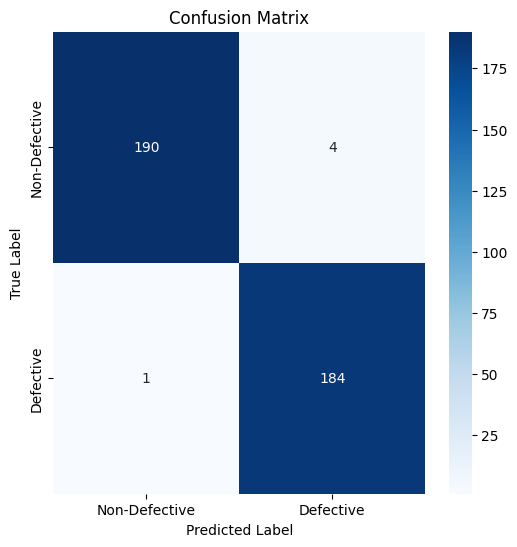

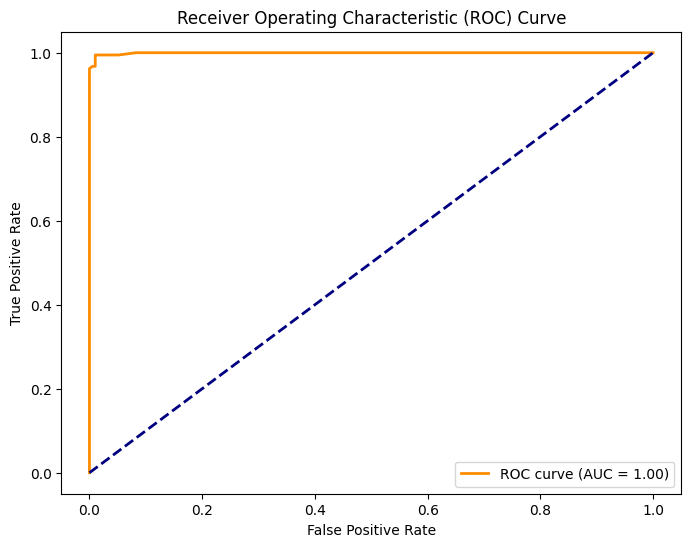

AUC Score: 0.9993
Jaccard Index: 0.9735


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, jaccard_score, confusion_matrix, roc_curve, auc
import seaborn as sns

# Predict probabilities for AUC score
y_prob = rf_model.predict_proba(X_test)[:, 1]

# AUC Score
auc_score = roc_auc_score(y_test, y_prob)

# Jaccard Index
y_pred = rf_model.predict(X_test)
jaccard = jaccard_score(y_test, y_pred)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

# Plot Confusion Matrix using Seaborn
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=['Non-Defective', 'Defective'], yticklabels=['Non-Defective', 'Defective'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Print all metrics
print(f'AUC Score: {auc_score:.4f}')
print(f'Jaccard Index: {jaccard:.4f}')


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

# Train a RandomForest model (if not already trained)
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)  # Assuming X_train and y_train are your data

# Get feature importances
importances = rf.feature_importances_

# Sort the features by importance
indices = importances.argsort()[::-1]

# Select the top N important features (e.g., top 50 or 100)
top_n = 200  # or 100 based on your choice
top_n_features = indices[:top_n]

# Select the top N features from the original dataset using .iloc
# .iloc is used for integer-location based indexing for selection by position.
X_selected = X_train.iloc[:, top_n_features]

In [ ]:
# Train a new RandomForest model with the selected features
rf_selected = RandomForestClassifier(n_estimators=100, random_state=42)
rf_selected.fit(X_selected, y_train)  # Using only the top N selected features

# Evaluate the model on the validation/test set
# Use .iloc to select columns by position
X_test_selected = X_test.iloc[:, top_n_features]  # Apply the same selection to the test set
accuracy_selected = rf_selected.score(X_test_selected, y_test)

print(f"Accuracy with selected features: {accuracy_selected * 100:.2f}%")

Accuracy with selected features: 99.47%


In [ ]:
print("Test Accuracy:", rf_selected.score(X_test_selected, y_test))


Test Accuracy: 1.0


In [ ]:
import joblib

# Save the model
joblib.dump(rf_model, "random_forest_model.pkl")

# Load the model later
loaded_model = joblib.load("random_forest_model.pkl")

# Test the loaded model
y_pred = loaded_model.predict(X_test)
